# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing necessary libraries

In [62]:
!pip install scikit-learn==1.5.2

In [63]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user

# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# Libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# To tune model, get different metric scores, and split data
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
)
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To impute missing values
from sklearn.impute import SimpleImputer
from sklearn import metrics

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To do hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To help with model building
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
!pip install xgboost==1.7.6
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

# To suppress scientific notations
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

In [64]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imblearn==0.12.0 xgboost==2.0.3 -q --user
# !pip install --upgrade -q threadpoolctl

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

In [65]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Loading the dataset

In [66]:
url = "/content/drive/My Drive/Colab Notebooks/Advanced Machine Learning/Project/BankChurners.csv"
CCchurn_df = pd.read_csv(url)

In [67]:
data_df = CCchurn_df.copy()

## Data Overview

- Observations
- Sanity checks

In [68]:
CCchurn_df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [69]:
CCchurn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

**Observations:**
- There are 6 object type columns and the rest are numerical columns.

CLIENTNUM - Ignore

Categorical Variables :
Attrition_Flag,Gender, Education_Level, Marital_Status,Income_Category, Card_Category

Numerical Variables :
Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon, Credit_Limit,Total_Revolving_Bal, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio

In [70]:
CCchurn_df.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


**Observations:**
- CLIENTNUM - unique identifier and can be ignored.
- Customer_Age - Mean age is around 46 years. Min age is 26 years and Max age is 73 years. Median is 46 years
- Dependent_count - Mean is around 2. Min is 0 and max is 5. Median is 2
- Months_on_book - Mean and Median is around 36 months. Min is 13 and max is 56 months.
- Total_Relationship_count - Mean is 3.8 and Median is 4. Min is 1 and Max is 6
- Months_Inactive_12_mon - Mean is 2.3 and Median is 2. Min is 0 and Max is 6
- Contacts_Count_12_mon - Mean is around 2.5 and Median is 2. Min is 0 and max is 6
- Credit_Limit - Mean is 8632 dollars and Median is 4549 dollars. Min is 1438 and max is 34516 dollars.
- Total_Revolving_Bal Mean is 815 dollars and Median is 1276 dollars. Min is 0 and max is 2517 dollars.
- Avg_Open_To_Buy - Mean is 7469 dollars and Median is 3474 dollars. Min is 3 and max is 34516 dollars
-Total_Amt_Chng_Q4_Q1 - Mean is 0.76 and Median is 0.74. Min is 0 and max is 3.4
- Total_Trans_Amt - Mean is 4404 dollars and Median is  3899 dollars. Min is 510 dollars and max is 18484 dollars.
- Total_Trans_Ct - Mean is 64.9 and Median is 67. Min is 10 and max is 139
- Total_Ct_Chng_Q4_Q1 - Mean is 0.71 and Median is 0.70. Min is 0 and max is 3.7
- Avg_Utilization_Ratio - Mean is 0.28 and Median is 0.18. Min is 0 and max is 0.999

In [71]:
CCchurn_df.shape

(10127, 21)

**Observations:**
- There are 10127 rows in the dataset and 21 columns

In [72]:
CCchurn_df.isnull().sum()

,0
CLIENTNUM,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0


**Observations:**
- Education_Level and Marital_Status columns have null values.

In [73]:
CCchurn_df.duplicated().sum()

0

**Observations:**
- There are no duplicates.

In [74]:
CCchurn_df['Attrition_Flag'].value_counts(normalize=True)

,proportion
Attrition_Flag,
Existing Customer,0.839
Attrited Customer,0.161


**Observations:**
- 83.9% are existing customers and 16.1% are attrited customers.
- This is an imbalanced dataset.

In [75]:
#Representing the target variable values as 0 and 1 instead of string values.
CCchurn_df['Attrition_Flag'] = CCchurn_df['Attrition_Flag'].map({'Existing Customer': 0, 'Attrited Customer': 1})

In [76]:
CCchurn_df['Attrition_Flag'].value_counts(normalize=True)

,proportion
Attrition_Flag,
0,0.839
1,0.161


## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



### Univariate Analysis :

Categorical Variables : (Barplot on the below variables)

Attrition_Flag,Gender, Education_Level, Marital_Status,Income_Category, Card_Category


Numerical Variables : (Histplot and Boxplot on the below variables)

CLIENTNUM - Ignore

Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon, Credit_Limit,Total_Revolving_Bal, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio

#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [77]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

**Observation on Customer_Age**

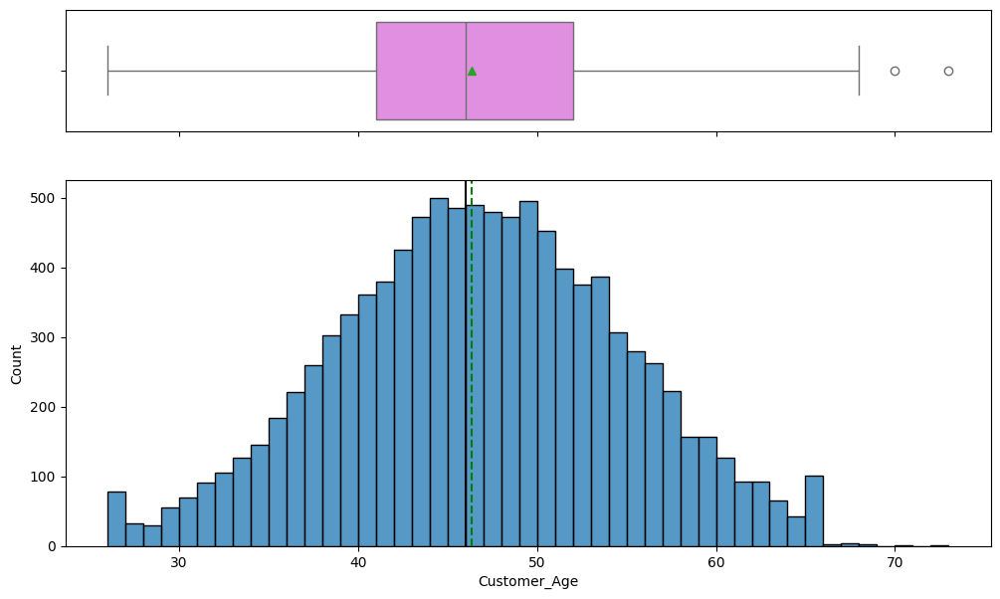

In [78]:
histogram_boxplot(CCchurn_df, 'Customer_Age')

Observations :
- Customer Age is uniformly distributed.
- There are few outliers.
- Mean and Median age is pretty close and is around 46.

**Observation on Dependent_count**

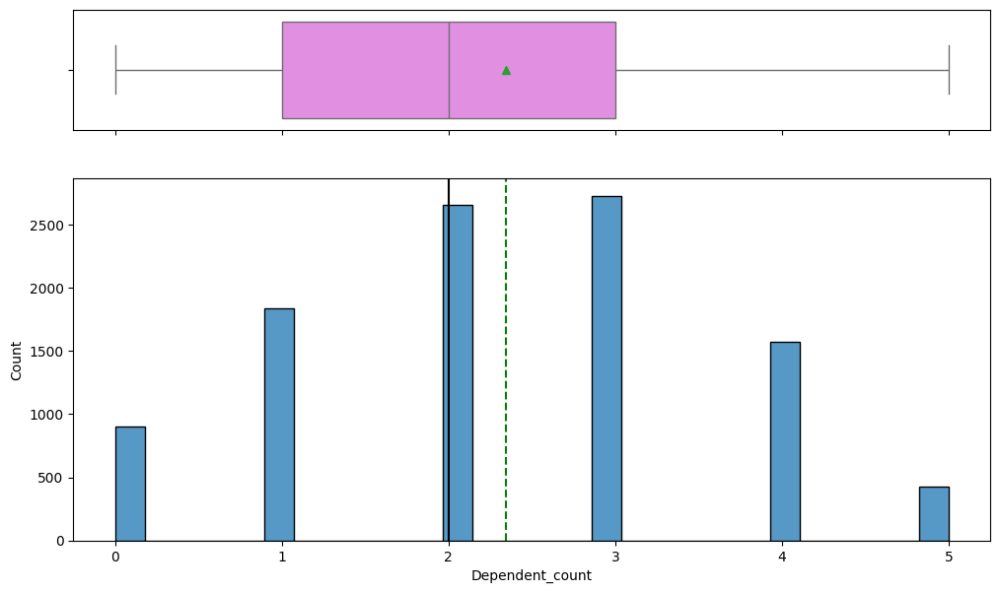

In [79]:
histogram_boxplot(CCchurn_df, 'Dependent_count')

Observations:
- Dependent count is uniformly distributed.
- There are no outliers.

**Observation on Months_on_book**

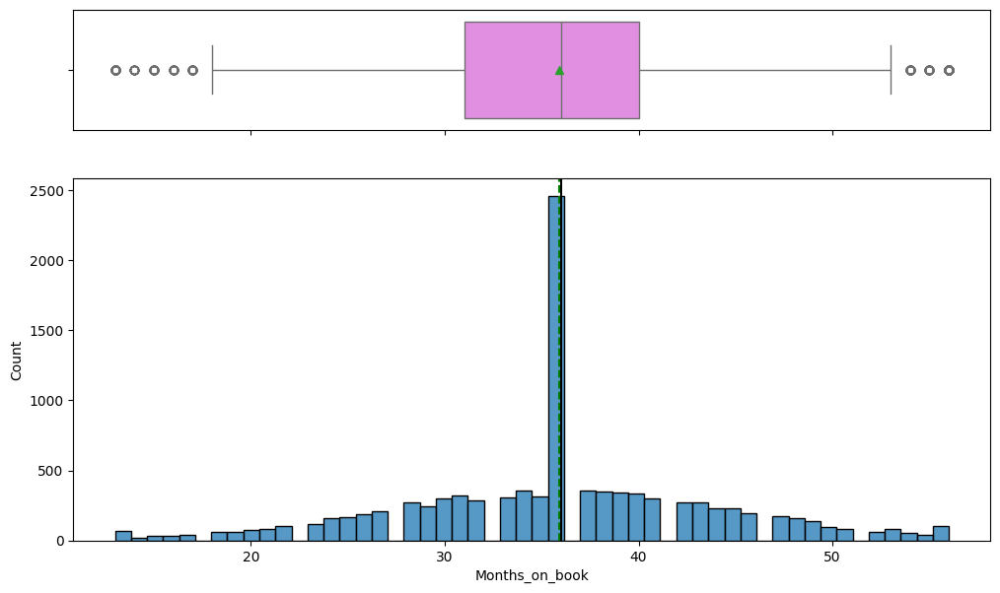

In [80]:
histogram_boxplot(CCchurn_df, 'Months_on_book')

Observations:
- Months on book is uniformly distributed.
- Number of customers peak at around 36 months.
- There are outliers.

**Observation on Total_Relationship_Count**

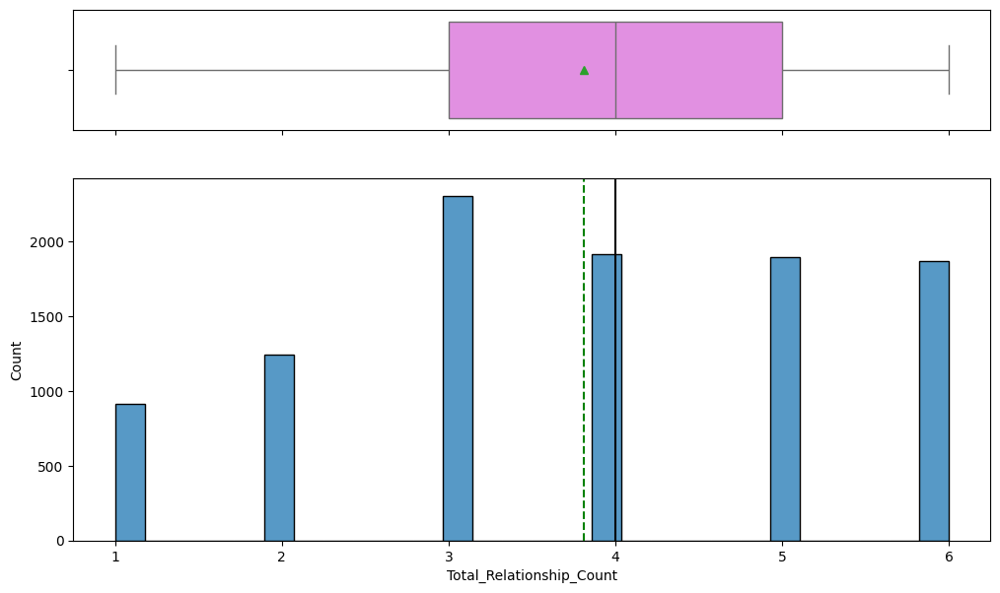

In [81]:
histogram_boxplot(CCchurn_df, 'Total_Relationship_Count')

Observations:
- There are no outliers
- More number of customers have Total relationship count -3

**Observation on  Months_Inactive_12_mon**

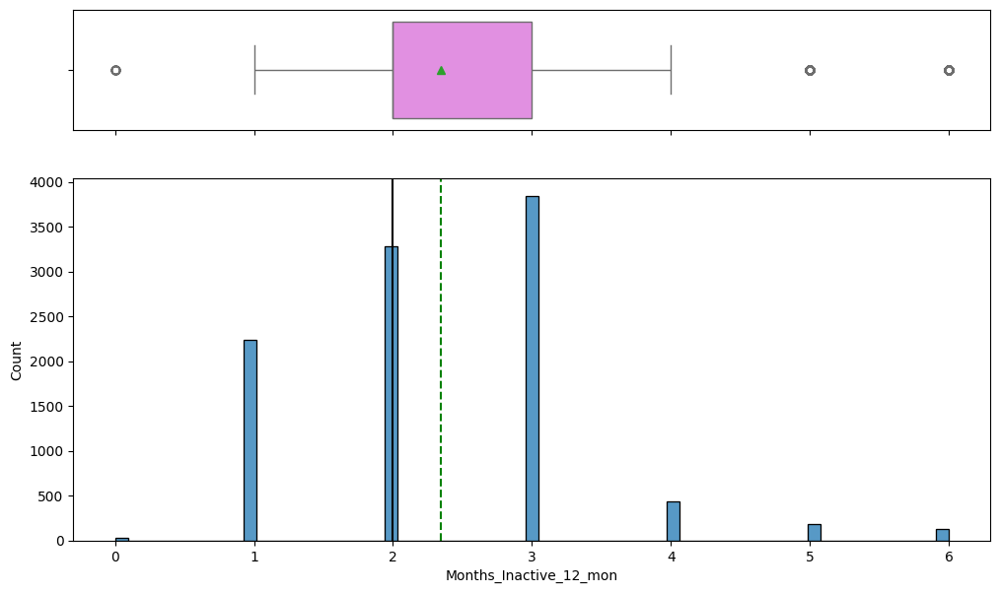

In [82]:
histogram_boxplot(CCchurn_df, 'Months_Inactive_12_mon')

Observations:
- Months_Inactive_12_mon is right skewed.
- There are outliers.
- More number of customers have 3 months inactive in the last 12 months.

**Observation on Contacts_Count_12_mon**

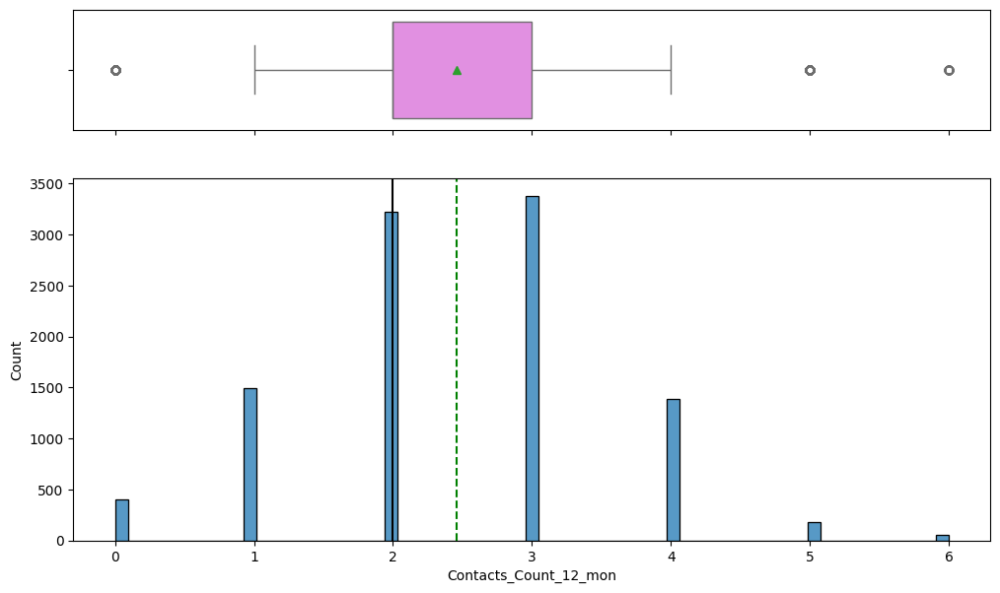

In [83]:
histogram_boxplot(CCchurn_df, 'Contacts_Count_12_mon')

Observations:
- Contacts_Count_12_mon is right skewed.
- There are outliers.

**Observation on  Credit_Limit**

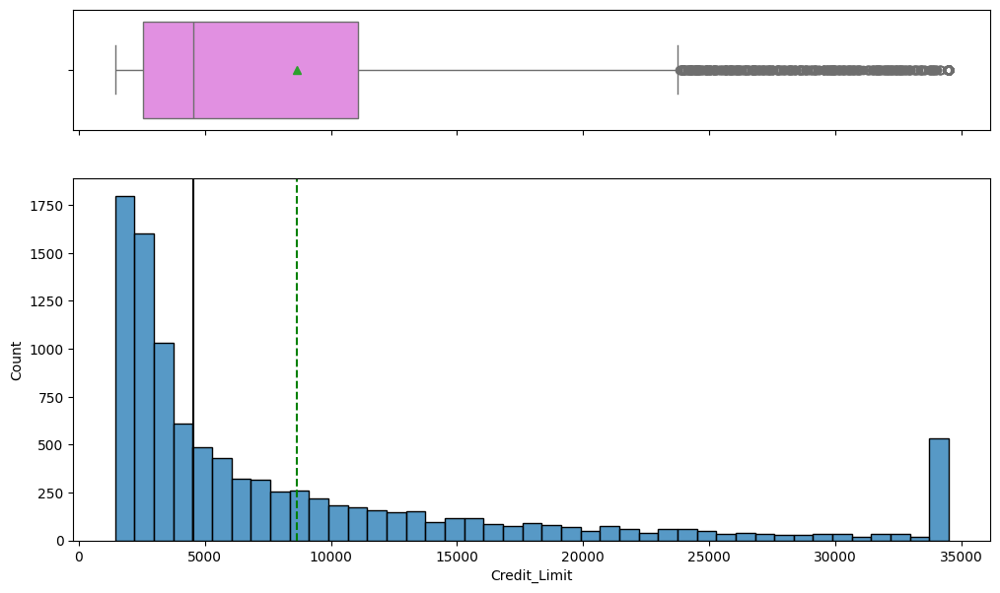

In [84]:
histogram_boxplot(CCchurn_df, 'Credit_Limit')

Observations:
- Credit limit is right skewed.
- There are outliers.

**Observation on Total_Revolving_Bal**

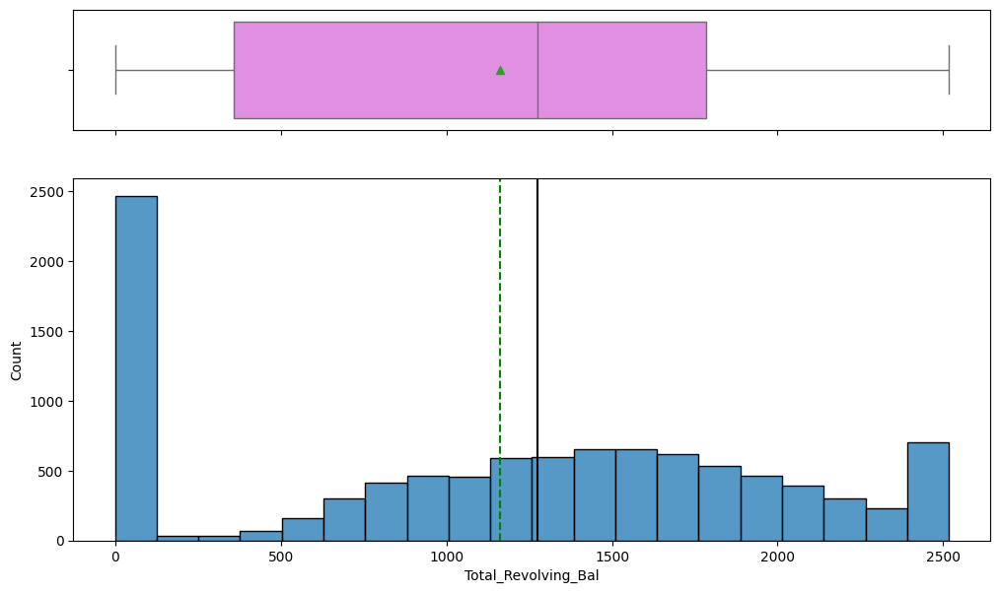

In [85]:
histogram_boxplot(CCchurn_df, 'Total_Revolving_Bal')

Observations:
- Total Revolving Bal is left skewed.
- There are no outliers.

**Observation on Avg_Open_To_Buy**

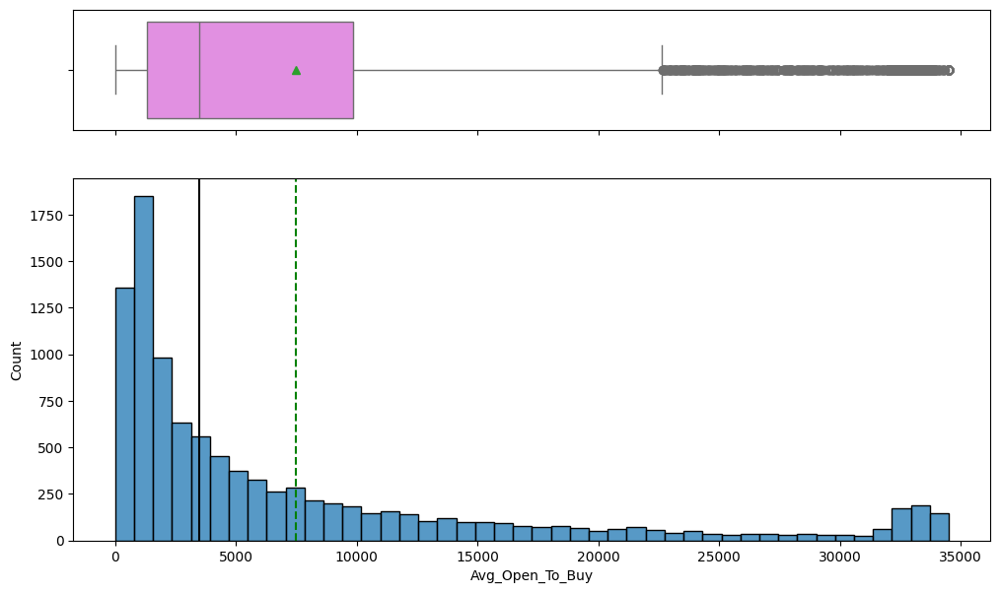

In [86]:
histogram_boxplot(CCchurn_df, 'Avg_Open_To_Buy')

Observations:
- Avg_Open_To_Buy is right skewed.
- There are outliers.

**Observation on Total_Amt_Chng_Q4_Q1**

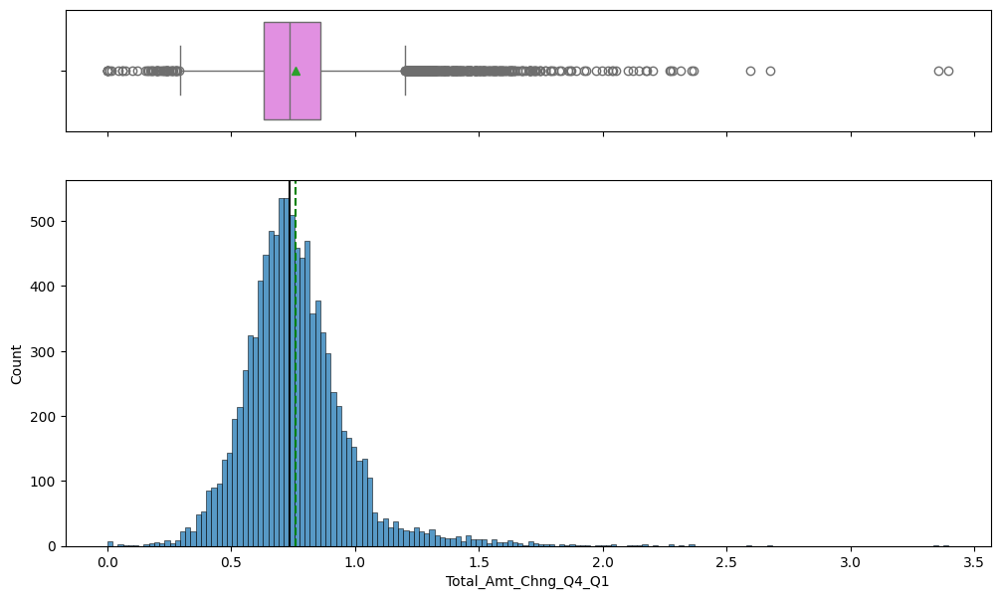

In [87]:
histogram_boxplot(CCchurn_df, 'Total_Amt_Chng_Q4_Q1')

Observations:
- Its a right skewed distribution.
- There are outliers.

**Observation on Total_Trans_Amt**

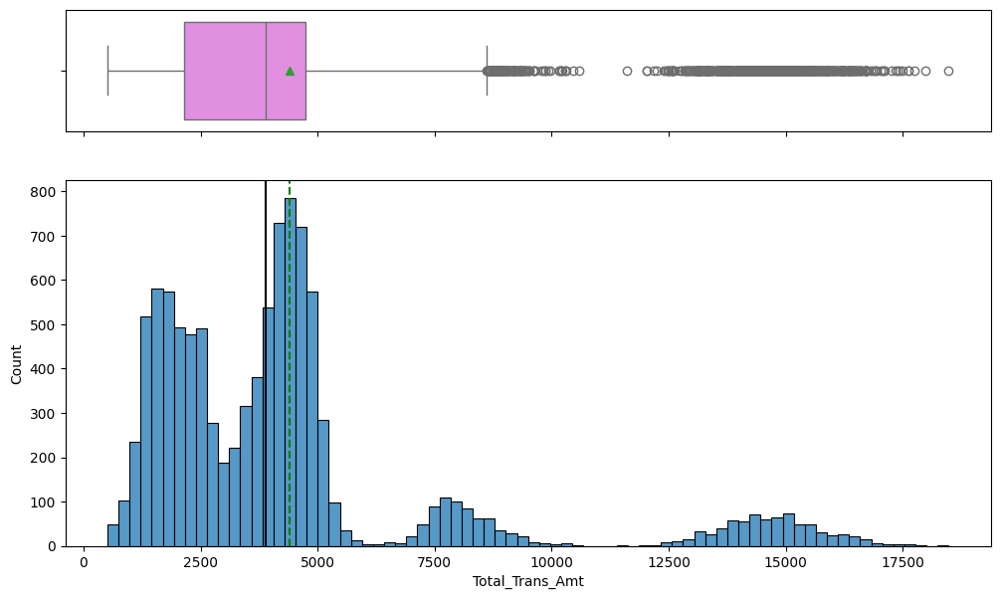

In [88]:
histogram_boxplot(CCchurn_df, 'Total_Trans_Amt')

Observations:
- Its a right skewed distribution.
- There are outliers.

Question 1:
How is the total transaction amount distributed?

Answer:
- Its a right skewed distribution.
- Small number of customers have significantly have total_trans_amount.
- Most of the customers have lower total transaction amount(<5000 dollars).
- There are some outliers as shown in the boxplot and those are customers with significantly higher transaction amount.


**Observation on Total_Trans_Ct**

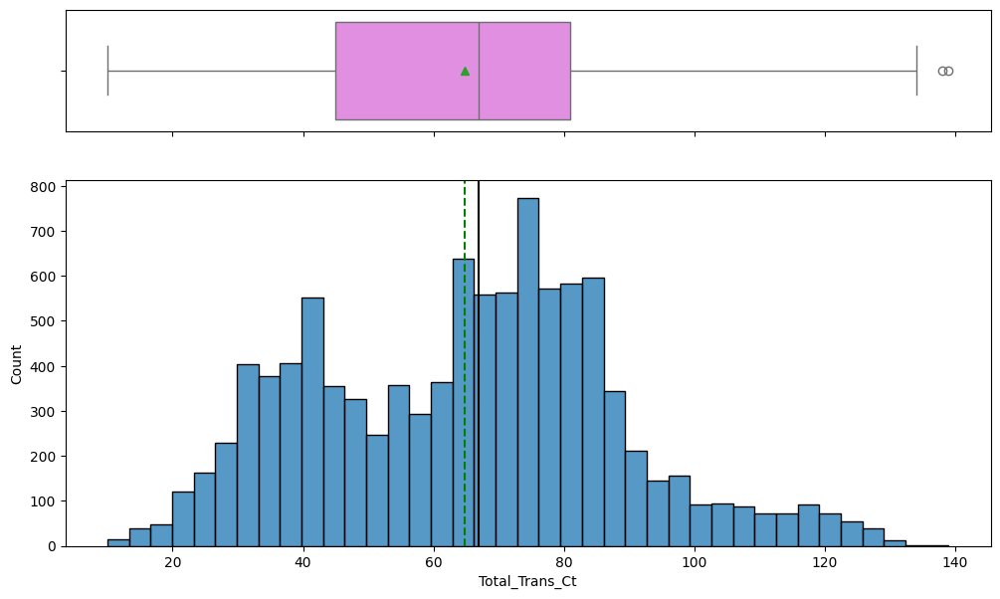

In [89]:
histogram_boxplot(CCchurn_df, 'Total_Trans_Ct')

Observations:
- There are few outliers.
- its a left skewed distribution.

**Observation on Total_Ct_Chng_Q4_Q1**

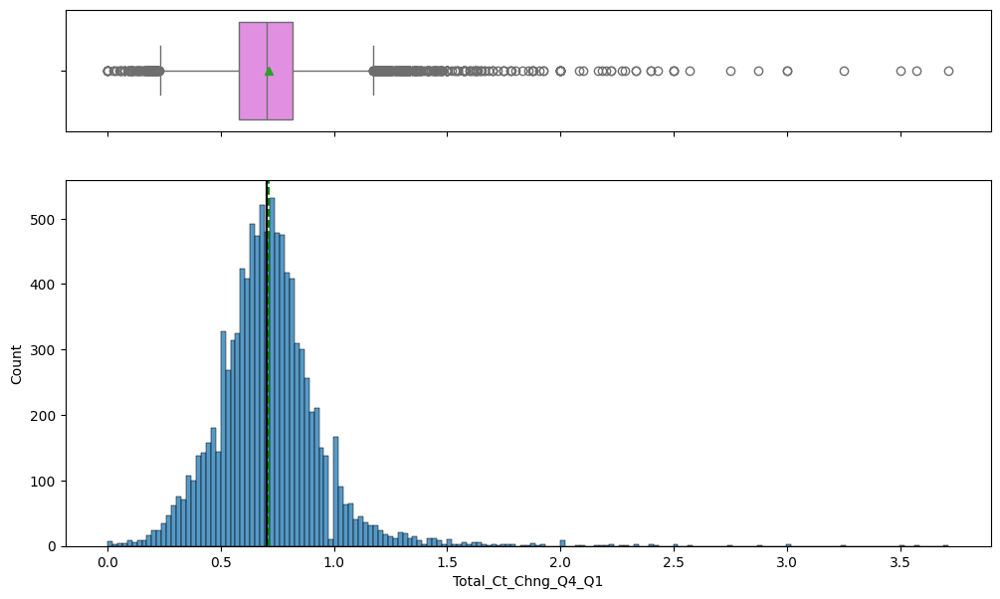

In [90]:
histogram_boxplot(CCchurn_df, 'Total_Ct_Chng_Q4_Q1')

Observations:
- Its right skewed distribution.
- There are outliers.

**Observation on Avg_Utilization_Ratio**

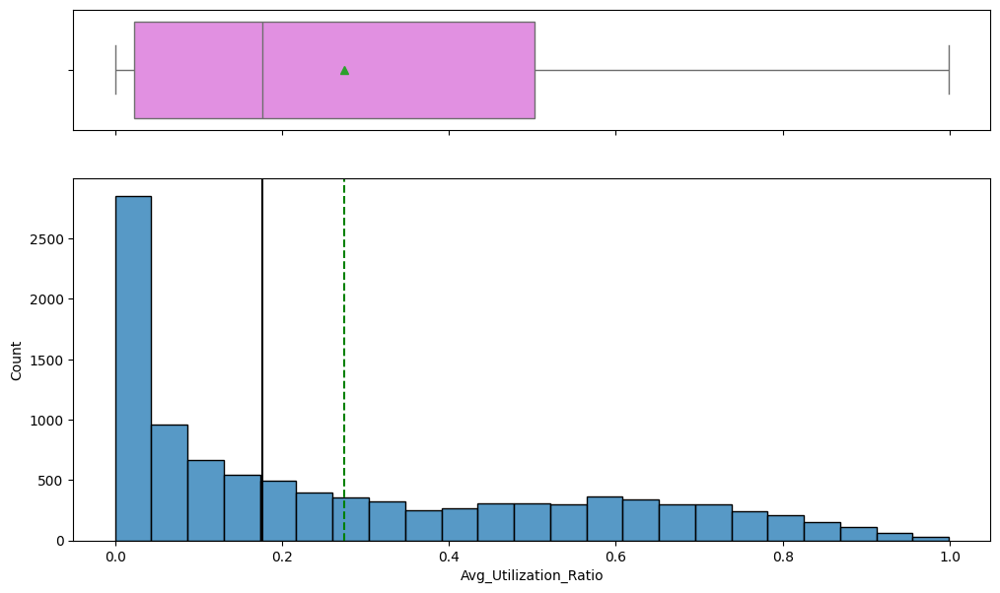

In [91]:
histogram_boxplot(CCchurn_df, 'Avg_Utilization_Ratio')

Observations:
- Its a right skewed distribution.
- There are no outliers.

In [92]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

**Observation on Attrition_Flag**

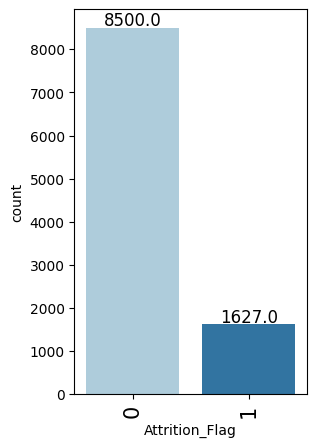

In [93]:
labeled_barplot(CCchurn_df, 'Attrition_Flag')

Observations:
- Existing customers are high in number when compared to attrited customers.

**Observation on Gender**

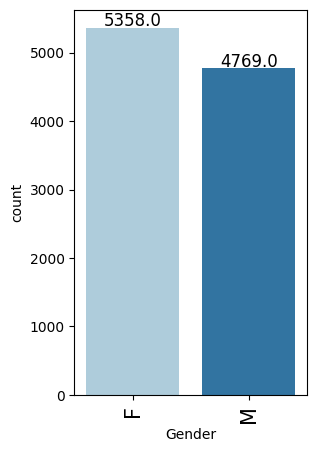

In [94]:
labeled_barplot(CCchurn_df, 'Gender')

Observations:
- There are more female customers when compared to male customers.

**Observation on Education_Level**

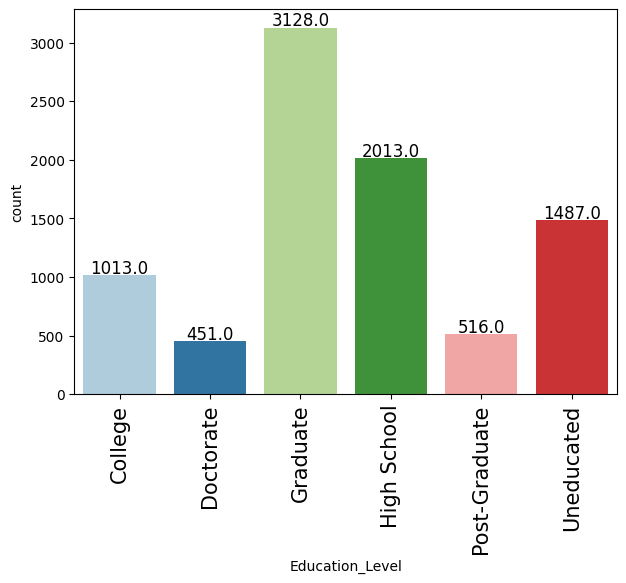

In [95]:
labeled_barplot(CCchurn_df, 'Education_Level')

Question 2: What is the distribution of the level of education of customers?

Answer : The above plot shows the distribution of the level of education of customers.
- Highest number of customers have graduate degree followed by high school degree and uneducated customers.
- Least number of customers have Doctorate.

**Observation on  Marital_Status**

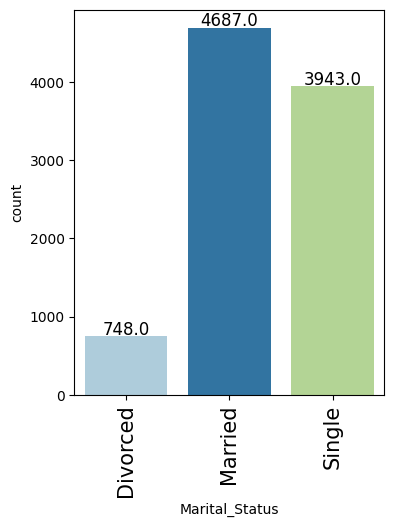

In [96]:
labeled_barplot(CCchurn_df, 'Marital_Status')

Observations:
- There are more married customers.
- There are least number of Divorced customers.

**Observation on Income_Category**

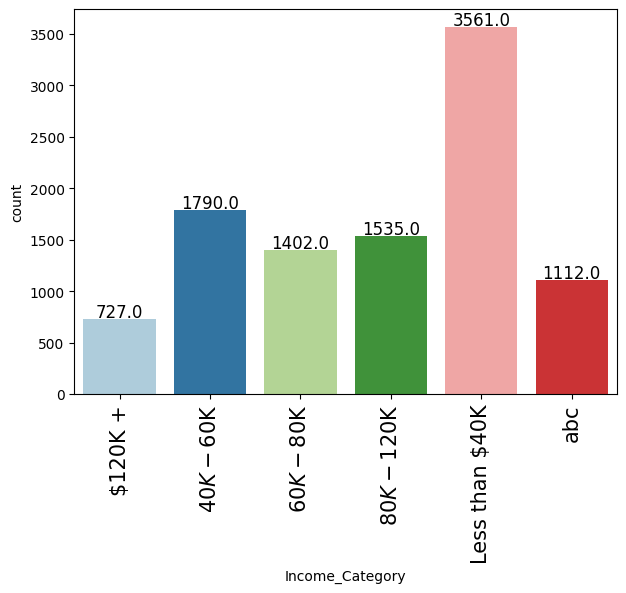

In [97]:
labeled_barplot(CCchurn_df, 'Income_Category')

Question 3: What is the distribution of the level of income of customers?

Answer : The above barplot shows the distribution of the level of income of customers.
- Highest number of customers have income less than $40k followed by customers with income 40k-60k.

- Least number of customers( 727 customers )with high income - $120k+ .

- We observe that there is a invalid category "abc" which will be treated appropriately in model pre-processing section.

**Observation on Card_Category**

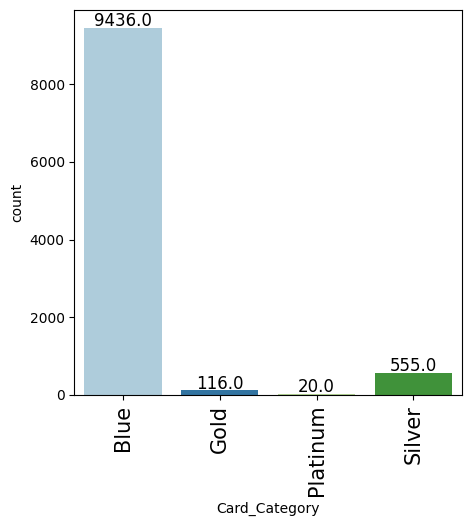

In [98]:
labeled_barplot(CCchurn_df, 'Card_Category')

Observations:
- Highest number of customers have Blue Card.
- Least number of customers have Platinum card.

### Bivariate Analysis

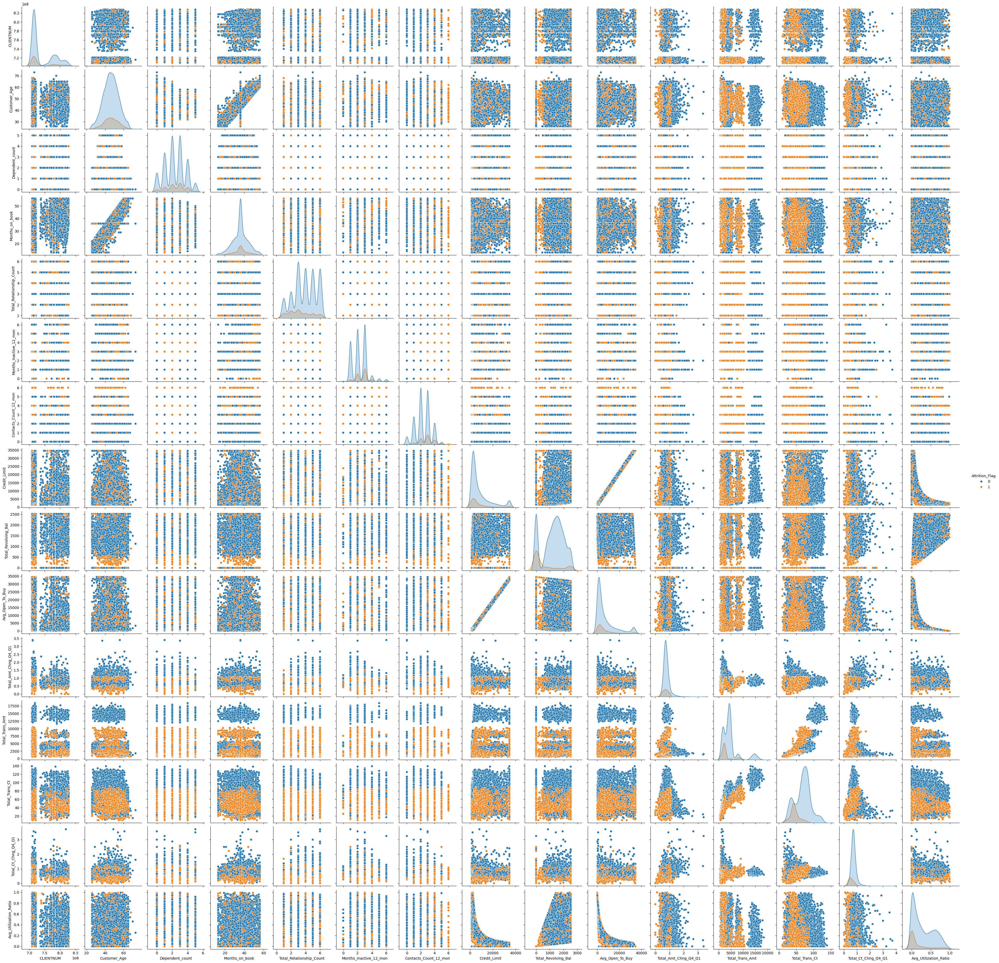

In [99]:
sns.pairplot(data=CCchurn_df,hue='Attrition_Flag')

Observations:
- Positive Correlation
    - Total_Trans_Ct and Total_Trans_Amt
    - Customer_Age and Months_on_book
    - Avg_Utilization_Ratio and Total_Revolving_Bal

- Negative Correlation
    - Avg_Utlization_Ratio and Avg_Open_To_Buy
    - Avg_Utilzation_Ratio and Credit_Limit

**Heatmap**

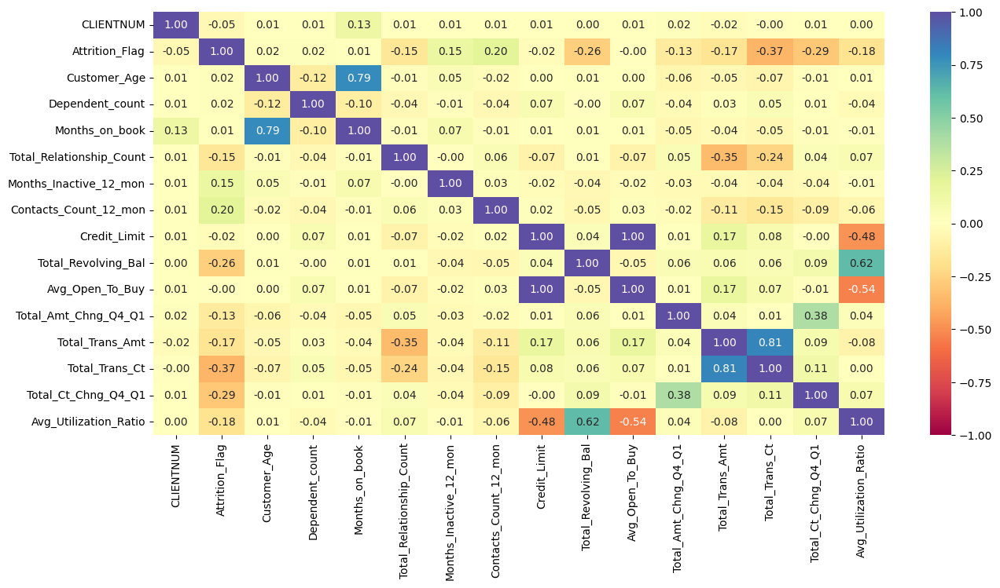

In [100]:
plt.figure(figsize=(15, 7))
numeric_df = CCchurn_df.select_dtypes(include=['number'])
sns.heatmap(numeric_df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

Question 6: What are the attributes that have a strong correlation with each other?

Answer: Below are the strongly correlated attributes
- Positive Correlation
    - Total_Trans_Ct and Total_Trans_Amt
    - Customer_Age and Months_on_book
    - Avg_Utilization_Ratio and Total_Revolving_Bal

- Negative Correlation
    - Avg_Utlization_Ratio and Avg_Open_To_Buy
    - Avg_Utilzation_Ratio and Credit_Limit

### Analysis of relationships of all variables on target variable

Relationship of categorical variables on Target variable

Gender vs Attrition_Flag

Education_Level vs Attrition_Flag

Martial_Status  vs Attrition_Flag

Income_Category vs Attrition_Flag

Card_Category vs Attrition_Flag

In [101]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

**Gender vs Attrition_Flag**



Attrition_Flag     0     1    All
Gender                           
All             8500  1627  10127
F               4428   930   5358
M               4072   697   4769
------------------------------------------------------------------------------------------------------------------------


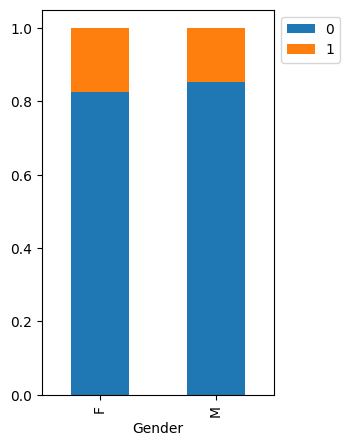

In [102]:
stacked_barplot(data=CCchurn_df, predictor='Gender', target='Attrition_Flag')

Observations:
- Distribution of female and male customers are very similar.
- Number of female attrited customers is slightly higher than male customers.

**Education_Level vs Attrition_Flag**



Attrition_Flag      0     1   All
Education_Level                  
All              7237  1371  8608
Graduate         2641   487  3128
High School      1707   306  2013
Uneducated       1250   237  1487
College           859   154  1013
Doctorate         356    95   451
Post-Graduate     424    92   516
------------------------------------------------------------------------------------------------------------------------


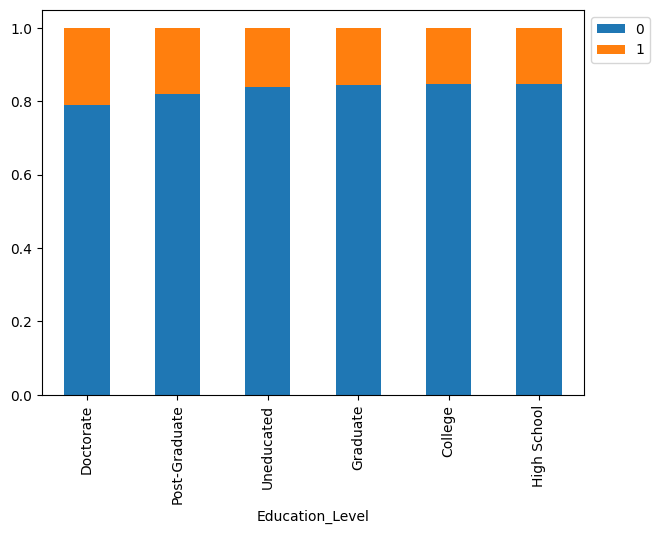

In [103]:
stacked_barplot(data=CCchurn_df, predictor='Education_Level', target='Attrition_Flag')

Observations:
- Attrition of customers with Doctorate is slightly higher followed by Post graduates.

**Martial_Status vs Attrition_Flag**



Attrition_Flag     0     1   All
Marital_Status                  
All             7880  1498  9378
Married         3978   709  4687
Single          3275   668  3943
Divorced         627   121   748
------------------------------------------------------------------------------------------------------------------------


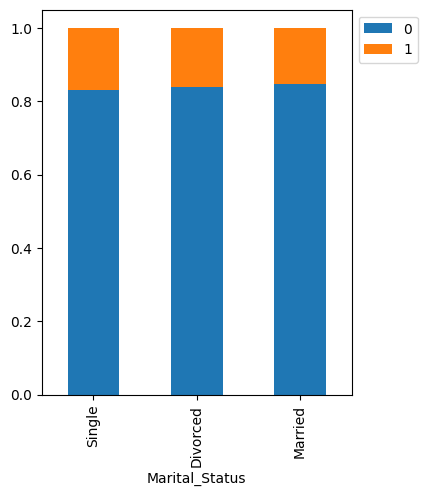

In [104]:
stacked_barplot(data=CCchurn_df, predictor='Marital_Status', target='Attrition_Flag')

Observations:
  - Distribution looks very similar in all three marital status category for existing customers vs attrited customers.

**Income_Category vs Attrition_Flag**


Attrition_Flag      0     1    All
Income_Category                   
All              8500  1627  10127
Less than $40K   2949   612   3561
$40K - $60K      1519   271   1790
$80K - $120K     1293   242   1535
$60K - $80K      1213   189   1402
abc               925   187   1112
$120K +           601   126    727
------------------------------------------------------------------------------------------------------------------------


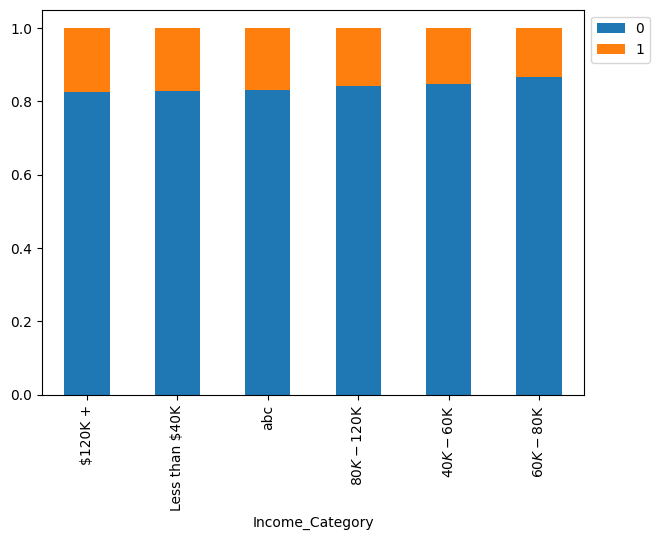

In [105]:
stacked_barplot(data=CCchurn_df, predictor='Income_Category', target='Attrition_Flag')

Observations:
- Attrition in all income category looks very similar. Less than 40k, $120k+ and abc are slightly higher than the rest.
- abc category will be addressed in data preprocessing section.

**Card_Category vs Attrition_Flag**

Attrition_Flag     0     1    All
Card_Category                    
All             8500  1627  10127
Blue            7917  1519   9436
Silver           473    82    555
Gold              95    21    116
Platinum          15     5     20
------------------------------------------------------------------------------------------------------------------------


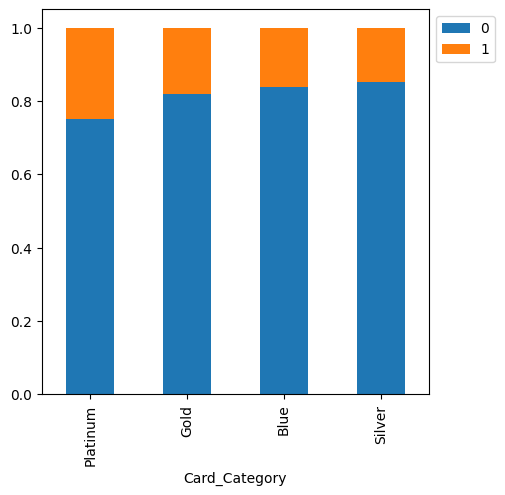

In [106]:
stacked_barplot(data=CCchurn_df, predictor='Card_Category', target='Attrition_Flag')

Observations:
- Attrition of customers with Platinum is higher than the other card categories.

**Relationship of numerical variables on target variable**

Customer_Age vs Attrition_Flag

Dependent_count vs Attrition_Flag

Months on book vs Attrition_Flag

Total_Relationship_Count  vs Attrition_Flag

Months_Inactive_12_mon vs Attrition_Flag

Contacts_Count_12_mon vs Attrition_Flag

Credit_Limit vs Attrition_Flag

Total_Revolving_Bal vs Attrition_Flag

Avg_Open_To_Buy vs Attrition_Flag

Total_Amt_Chng_Q4_Q1 vs Attrition_Flag

Total_Trans_Amt vs Attrition_Flag

Total_Trans_Ct vs Attrition_Flag

Total_Ct_Chng_Q4_Q1 vs Attrition_Flag

Avg_Utilization_Ratio vs Attrition_Flag



In [107]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

**Customer_Age vs Attrition_Flag**

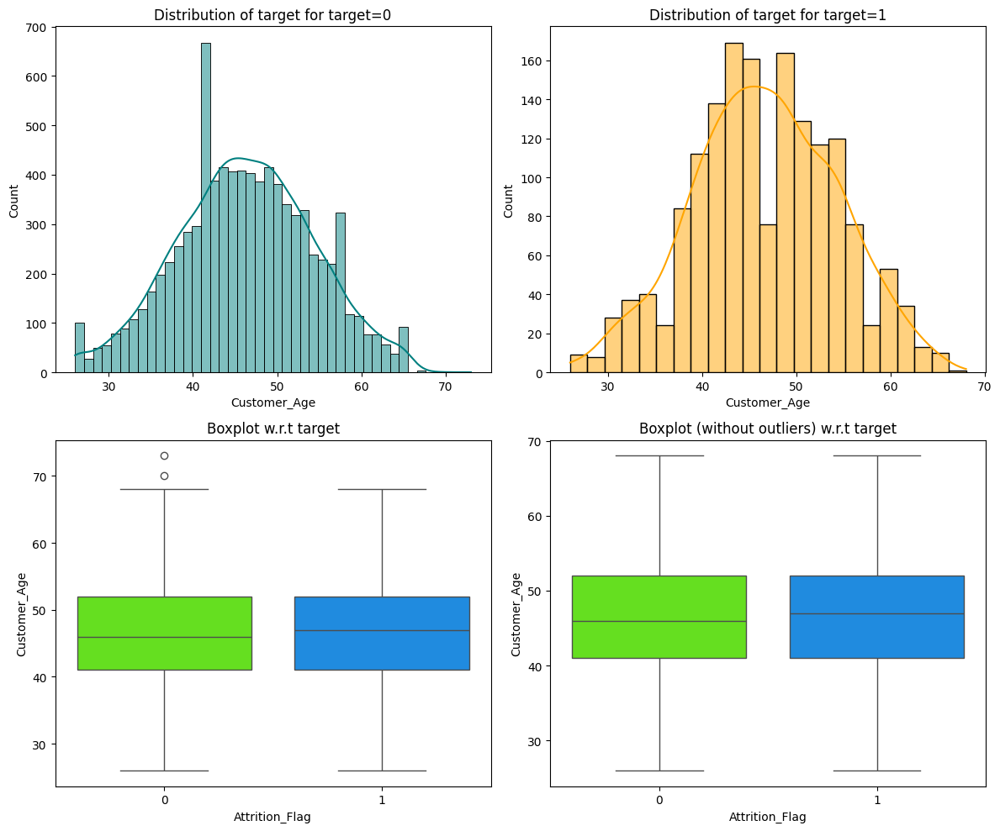

In [108]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Customer_Age', target='Attrition_Flag')


Observation:
- In hisplot,Overall the age distribution is symmetric in both existing customers and attrited customer.
- In Boxplot, we see that there are some outliers in existing customers. Variability is similar(IQR range is similar) across both set of customers
- Median age is similar for both exising customers and attrited customers.

**Dependent_count vs Attrition_Flag**


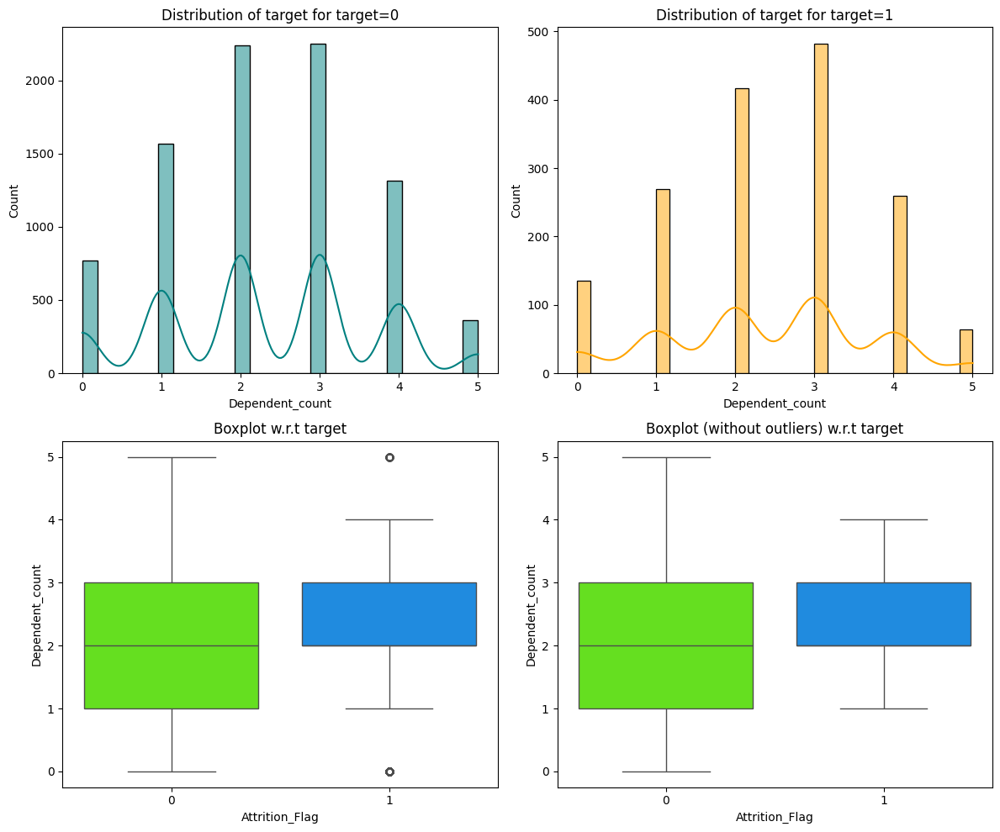

In [109]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Dependent_count', target='Attrition_Flag')

Observations:
- In Boxplot, there are few outliers for attrited customers. The IQR range is wider in existing customers( 1 to 3) when compared to attrited customers(2 to 3).This indicates more variability in existing customers than the attrited customers.
- In histogram, most frequently occured values is 2 and 3 in existing customers and 3 for attrited customers.

Attrition_Flag      0     1    All
Dependent_count                   
All              8500  1627  10127
3                2250   482   2732
2                2238   417   2655
1                1569   269   1838
4                1314   260   1574
0                 769   135    904
5                 360    64    424
------------------------------------------------------------------------------------------------------------------------


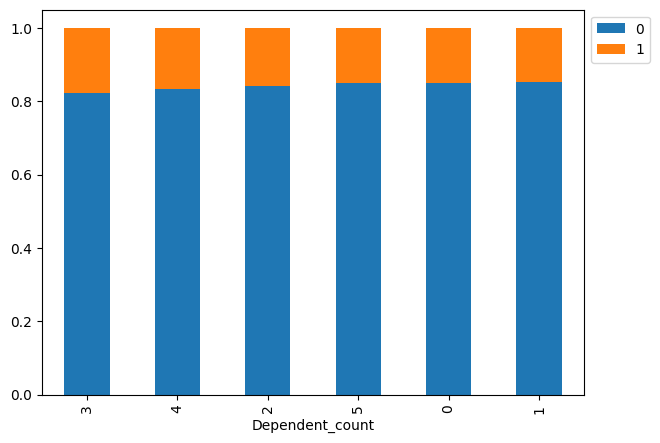

In [110]:
stacked_barplot(data=CCchurn_df, predictor='Dependent_count', target='Attrition_Flag')

Observations:
- Distribution is similar across all dependent_count.

**Months on book vs Attrition_Flag**


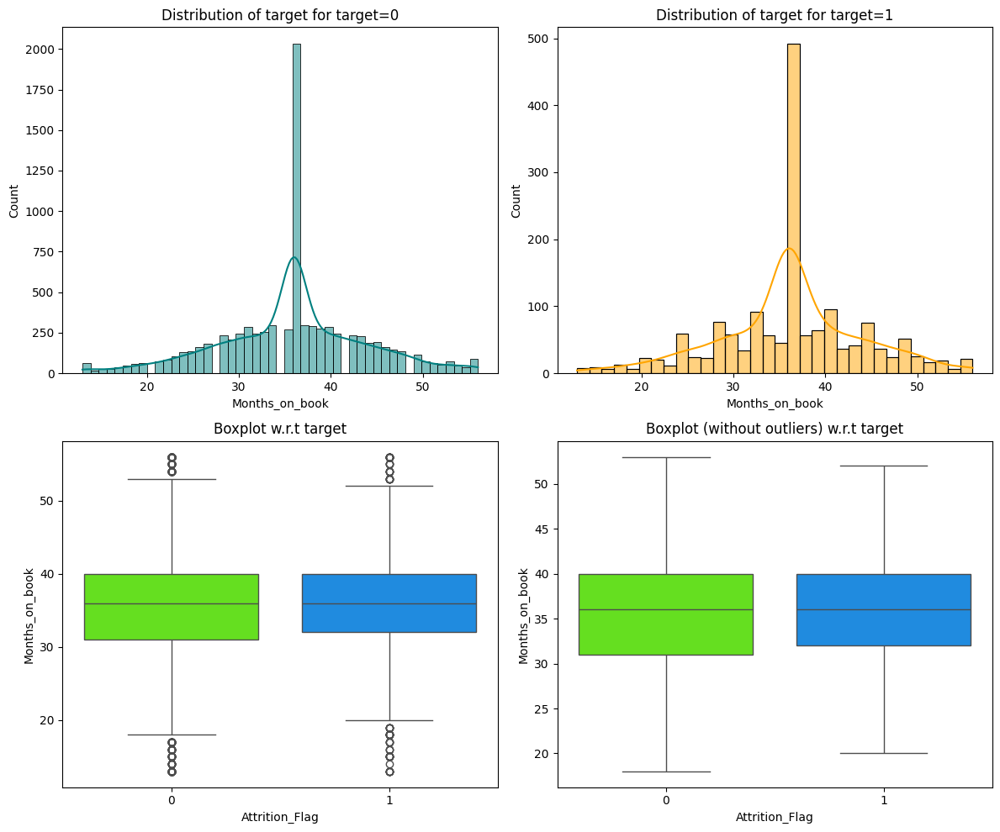

In [111]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Months_on_book', target='Attrition_Flag')

Observations:
- In histplot, max customers have around 36 months as months_on_book for both existing customers and attrited customers.
- In boxplot, we can see that there are outliers in both types of customers.
- The IQR range is slighter larger for existing customers than attriting customers. the Median is similar across both the groups and around 36 months.



**Total_Relationship_Count vs Attrition_Flag**


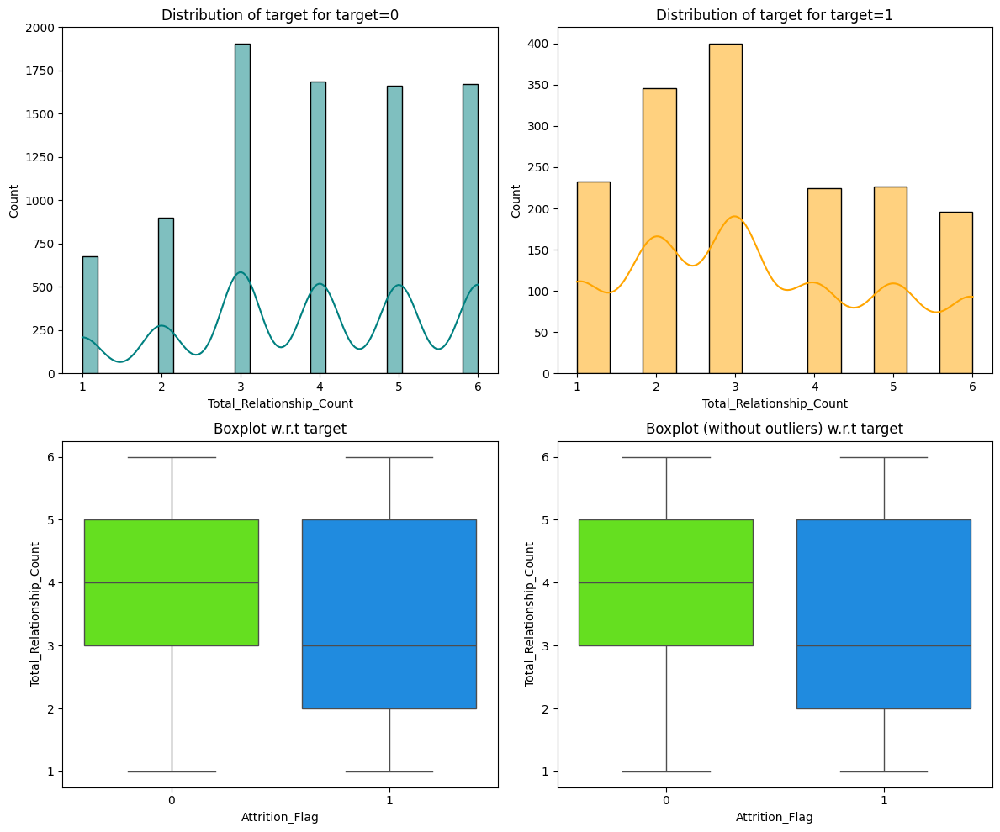

In [112]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Total_Relationship_Count', target='Attrition_Flag')

Observations:
- In histplot, we see that highest number of customers have total relationship count of 3.
- In boxplot, we see more variability or IQR wider range in attrited customers.
- The median of attrited customer is lower than existing customers. So existing customers tend to have more products when compared to the attrited customer.

Attrition_Flag               0     1    All
Total_Relationship_Count                   
All                       8500  1627  10127
3                         1905   400   2305
2                          897   346   1243
1                          677   233    910
5                         1664   227   1891
4                         1687   225   1912
6                         1670   196   1866
------------------------------------------------------------------------------------------------------------------------


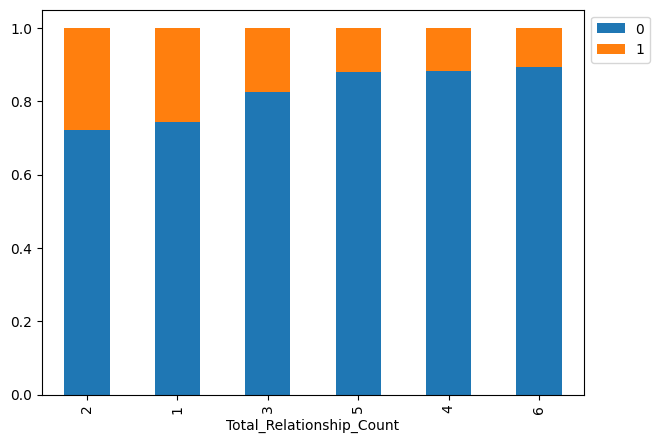

In [113]:
stacked_barplot(data=CCchurn_df, predictor='Total_Relationship_Count', target='Attrition_Flag')

Observations:
- In, Total relationship count of 2 and 1, the ratio of existing customer to attrited customer is similar. Attrited customers are more in these two.



**Months_Inactive_12_mon vs Attrition_Flag**


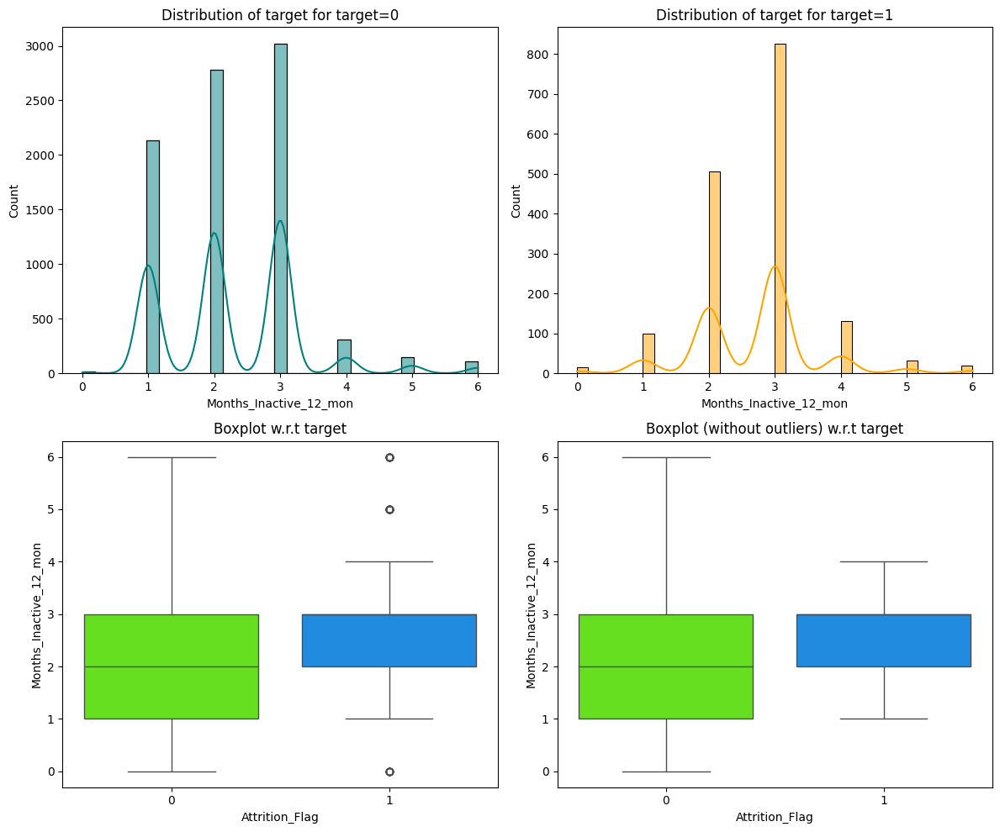

In [114]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Months_Inactive_12_mon', target='Attrition_Flag')

Observations:
 - In histplot, we see that max number of customers have months_inactive_12_mon as 3. This is for both existing and attrited customers.
 - In boxplot, we see wider IQR range of 1 to 3 for existing customers and 2 to 3 range for attrited customer.
 - Median is 2 for existing customers and 3 for attrited customers.

In [115]:
#get the median of months_inactive_12_mon for attrited customers since median line is not visible
CCchurn_df[CCchurn_df['Attrition_Flag'] == 1]['Months_Inactive_12_mon'].median()

3.0

Question 5: How does the number of months a customer was inactive in the last 12 months (Months_Inactive_12_mon) vary by the customer's account status (Attrition_Flag)?

Answer: The above boxplot shows the following:
- The IQR is wide spread for existing customers(range of 1 to 3) than attrited customers where the IQR range is 2 to 3.
- Median number of months a customer was inactive in the last 12 months for attrited customer is 3 which is higher than existing customer with value of 2.
- There are few outliers in attrited customers.

Attrition_Flag             0     1    All
Months_Inactive_12_mon                   
All                     8500  1627  10127
3                       3020   826   3846
2                       2777   505   3282
4                        305   130    435
1                       2133   100   2233
5                        146    32    178
6                        105    19    124
0                         14    15     29
------------------------------------------------------------------------------------------------------------------------


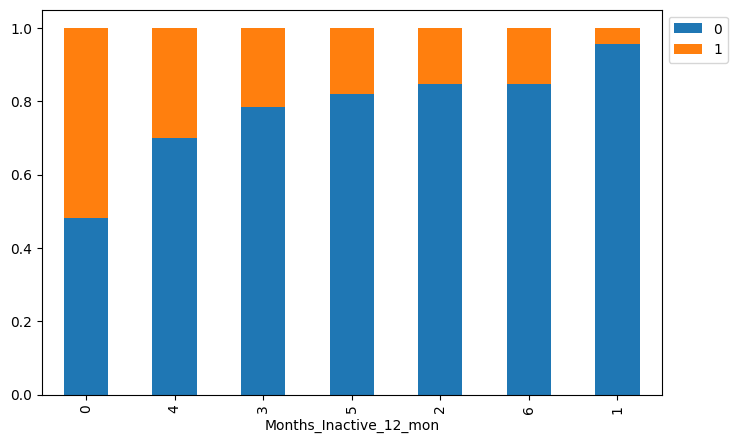

In [116]:
stacked_barplot(data=CCchurn_df, predictor='Months_Inactive_12_mon', target='Attrition_Flag')

Observations
- we see 0 months having more attrited customers than existing customers.


**Contacts_Count_12_mon vs Attrition_Flag**


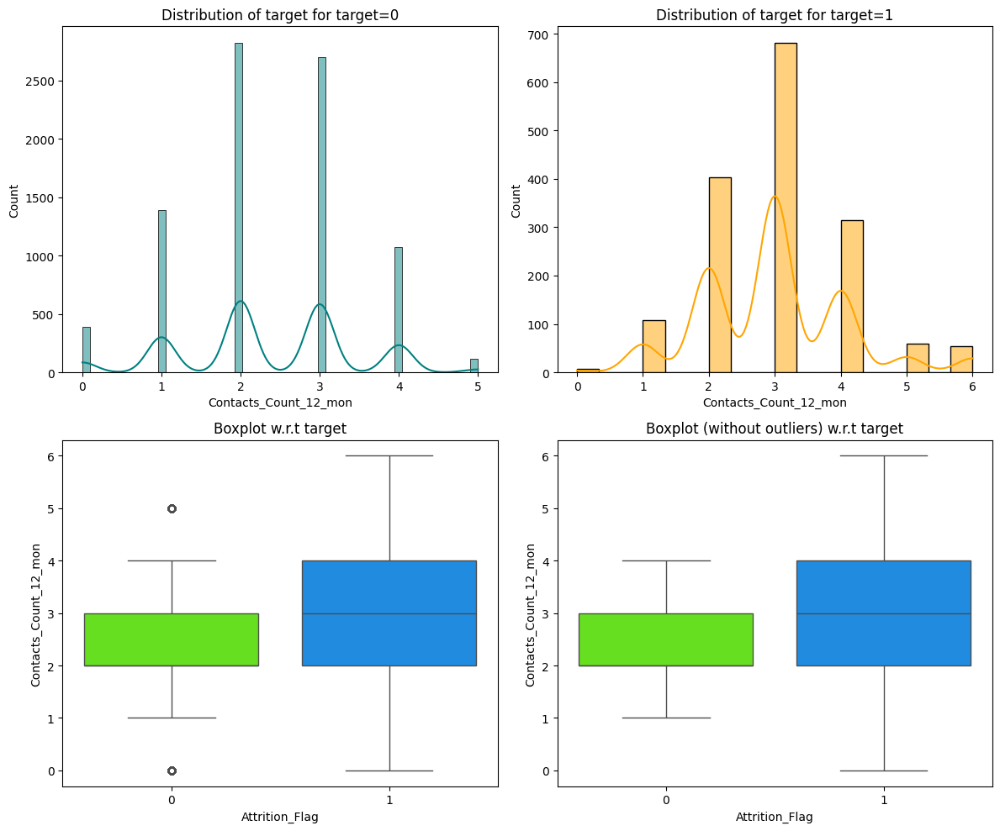

In [117]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Contacts_Count_12_mon', target='Attrition_Flag')

Attrition_Flag            0     1    All
Contacts_Count_12_mon                   
All                    8500  1627  10127
3                      2699   681   3380
2                      2824   403   3227
4                      1077   315   1392
1                      1391   108   1499
5                       117    59    176
6                         0    54     54
0                       392     7    399
------------------------------------------------------------------------------------------------------------------------


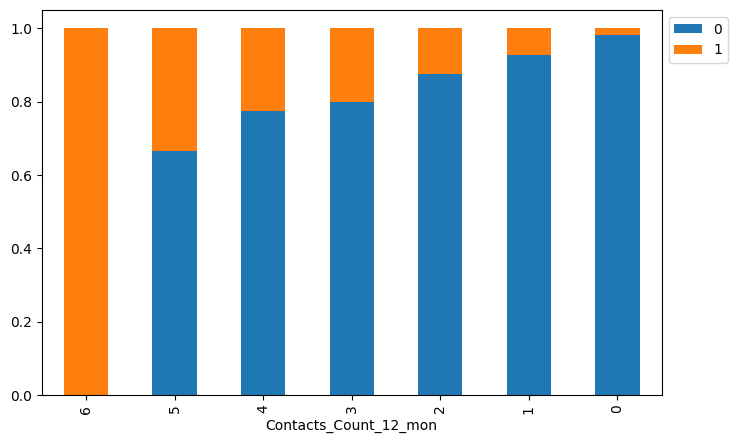

In [118]:
stacked_barplot(data=CCchurn_df, predictor='Contacts_Count_12_mon', target='Attrition_Flag')


**Credit_Limit vs Attrition_Flag**


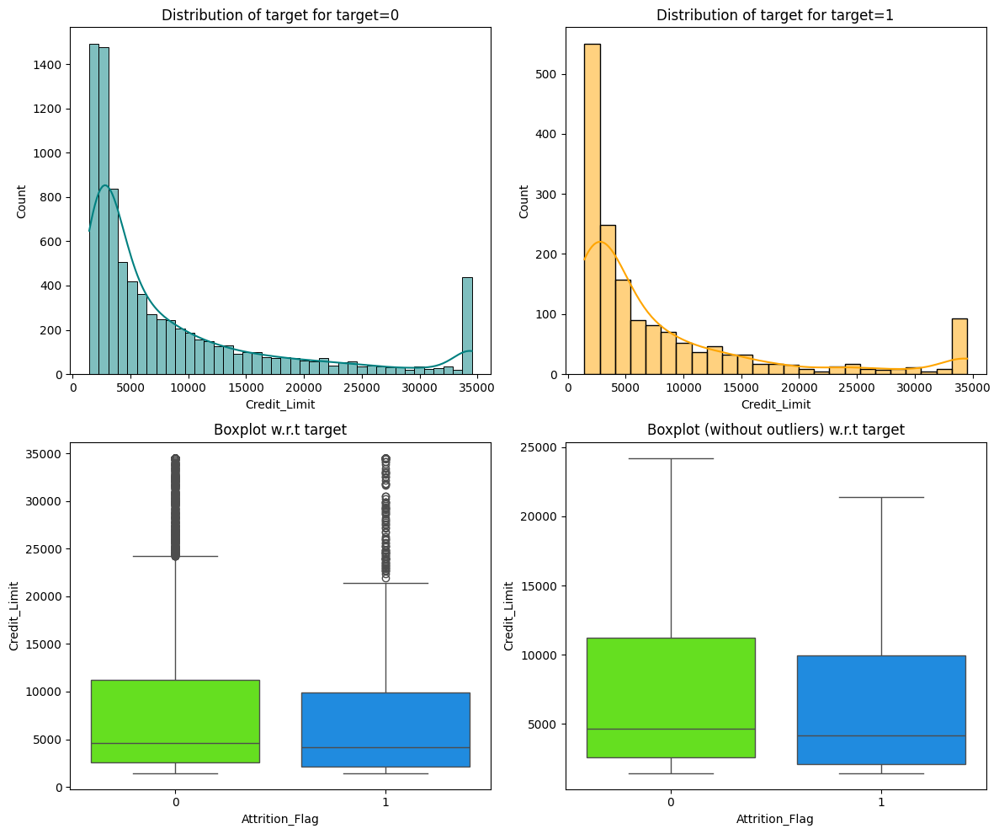

In [119]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Credit_Limit', target='Attrition_Flag')

Observations:


**Total_Revolving_Bal vs Attrition_Flag**


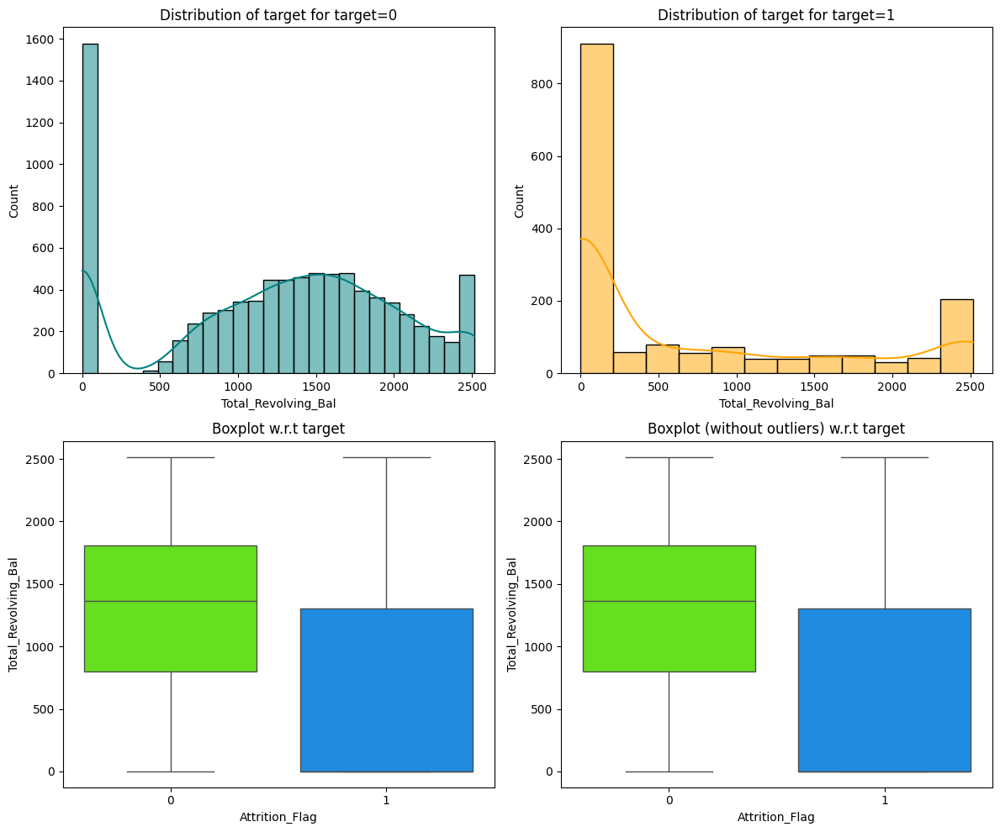

In [120]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Total_Revolving_Bal', target='Attrition_Flag')

Observations:
- In histplot, we see that most customers in both existing customers and attrited customers category have 0 Total revolving balance
- In Box plot, we see that attrited customers have wider IQR range from 0 to 1400 dollars. Existing customers IQR range from around 800 dollars to 1800 dollars.
- Median for existing customers is around 1400 dollars and 0 for attrited customers.


In [121]:
#get the median total_revolving_bal of attrited customers
CCchurn_df[CCchurn_df['Attrition_Flag'] == 1]['Total_Revolving_Bal'].median()

0.0


**Avg_Open_To_Buy vs Attrition_Flag**


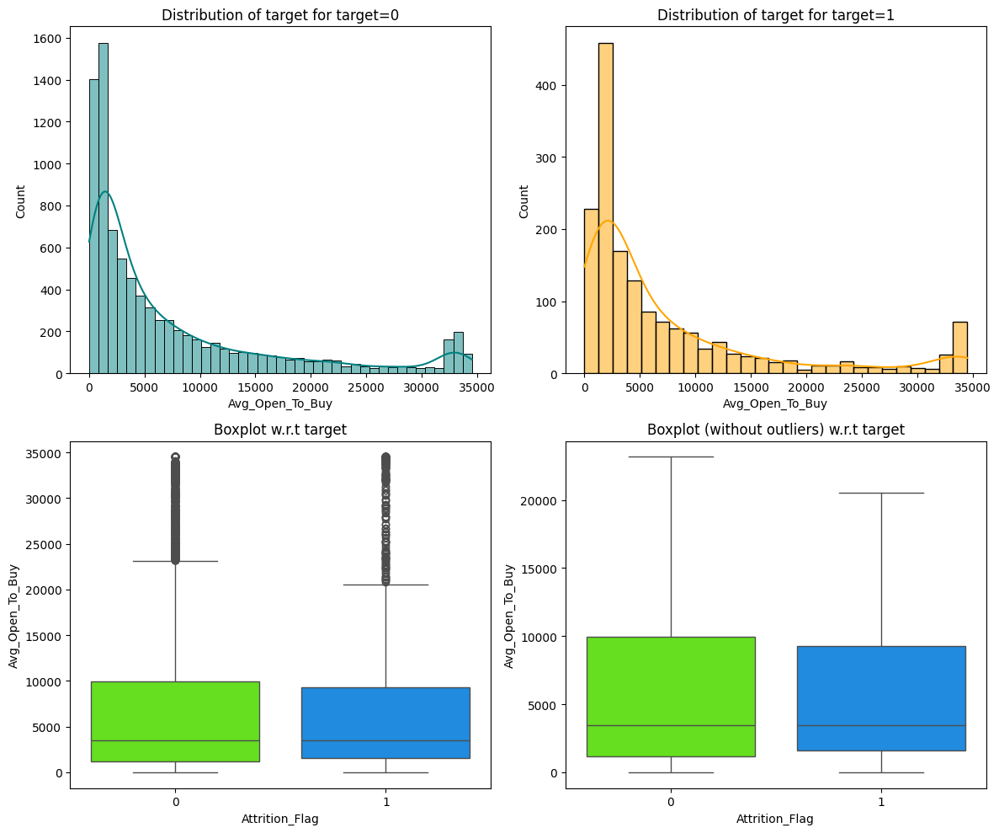

In [122]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Avg_Open_To_Buy', target='Attrition_Flag')


**Total_Amt_Chng_Q4_Q1 vs Attrition_Flag**




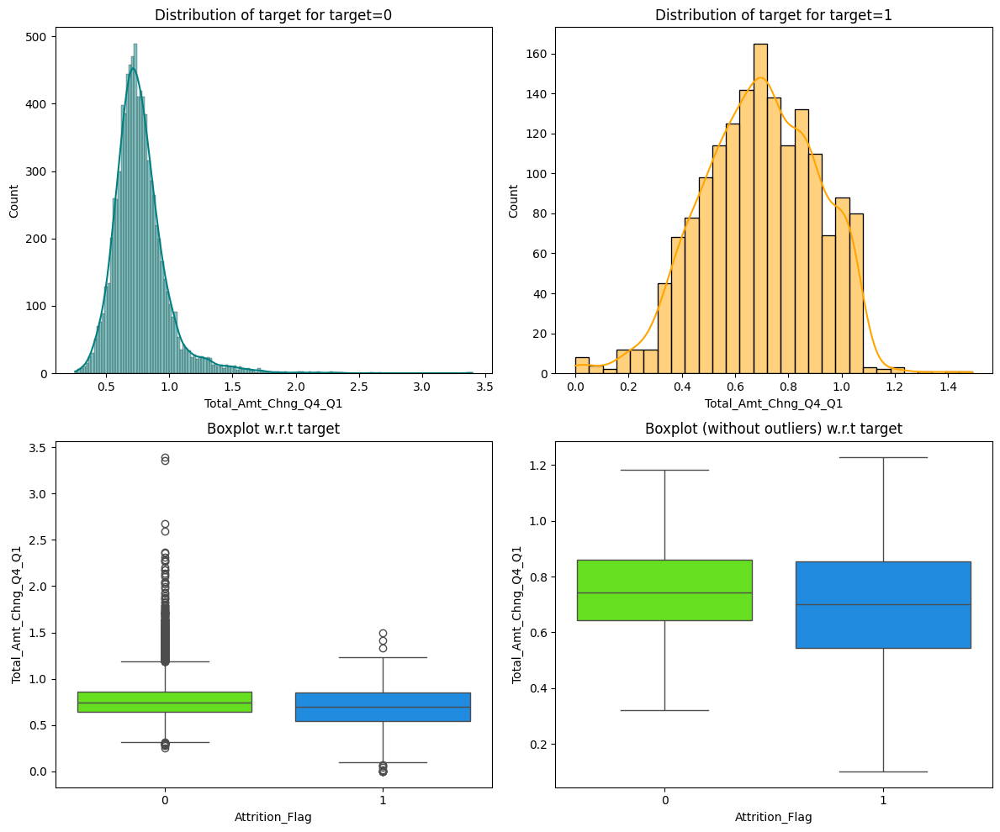

In [123]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Total_Amt_Chng_Q4_Q1', target='Attrition_Flag')

**Total_Trans_Amt vs Attrition_Flag**

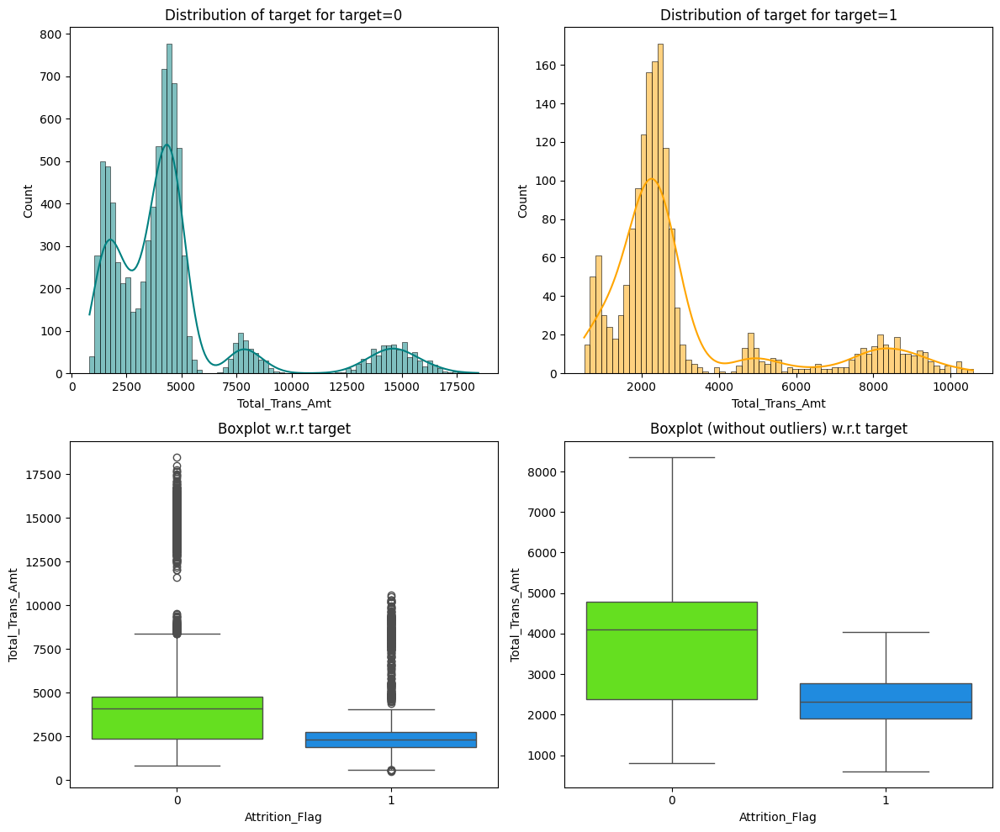

In [124]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Total_Trans_Amt', target='Attrition_Flag')

Observations:
- In histplot, we see the total_trans_amt is upto 10000 for attrited customers and 17500 for existing customers.
- In Boxplot, we see outliers for both types of customers. Variability is wider with existing customers than attrited customers.IQR range is from 2500 dollars to 5000 dollars for existing customers and 2000 dollars to around 2750 dollars for attrited customers.

**Total_Trans_Ct vs Attrition_Flag**



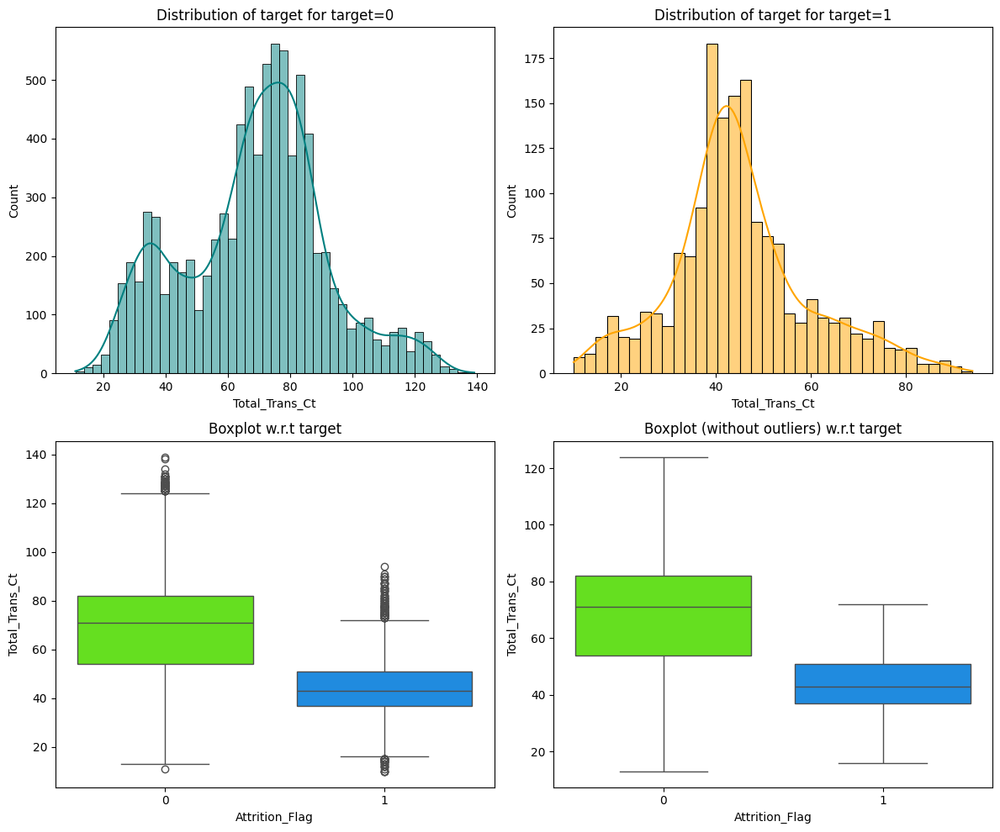

In [125]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Total_Trans_Ct', target='Attrition_Flag')

Observations:
- In boxplot, we see the IQR range is from 55 to 80 for existing customers and 38 to 50 for attrited customers. We see that the total transaction count is relatively lower in attrited customers.

**Total_Ct_Chng_Q4_Q1 vs Attrition_Flag**



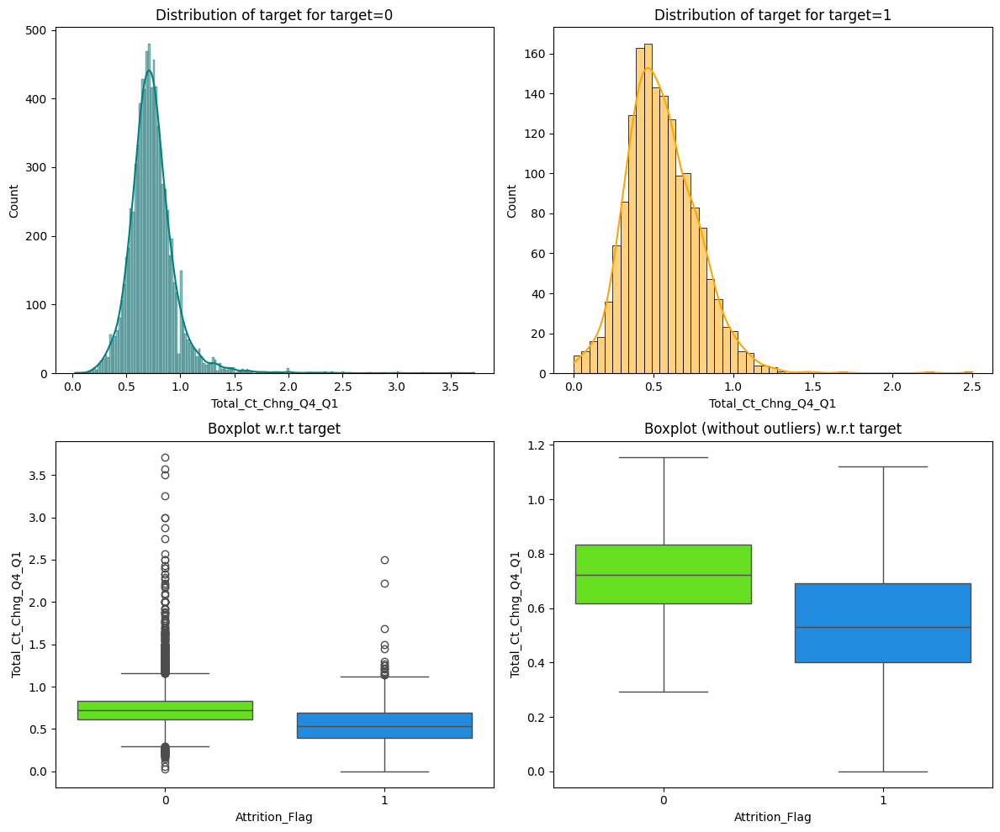

In [126]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Total_Ct_Chng_Q4_Q1', target='Attrition_Flag')

Question 4: How does the change in transaction amount between Q4 and Q1 (total_ct_change_Q4_Q1) vary by the customer's account status (Attrition_Flag)?

Answer:
 In the above box plot, we observe the following:
 - The Total_Ct_Chng_Q4_Q1 IQR range(Q1 and Q4) is wider for attrited customers than  existing customers. There is more variability in attrited customers.
 - Attrited customers have lower median change in transaction amount between Q4 and Q1 when compared to existing customers.
 - There are more outliers with existing customers and ranges till around 3.6 when compared to 2.5 for attrited customers.

**Avg_Utilization_Ratio vs Attrition_Flag**

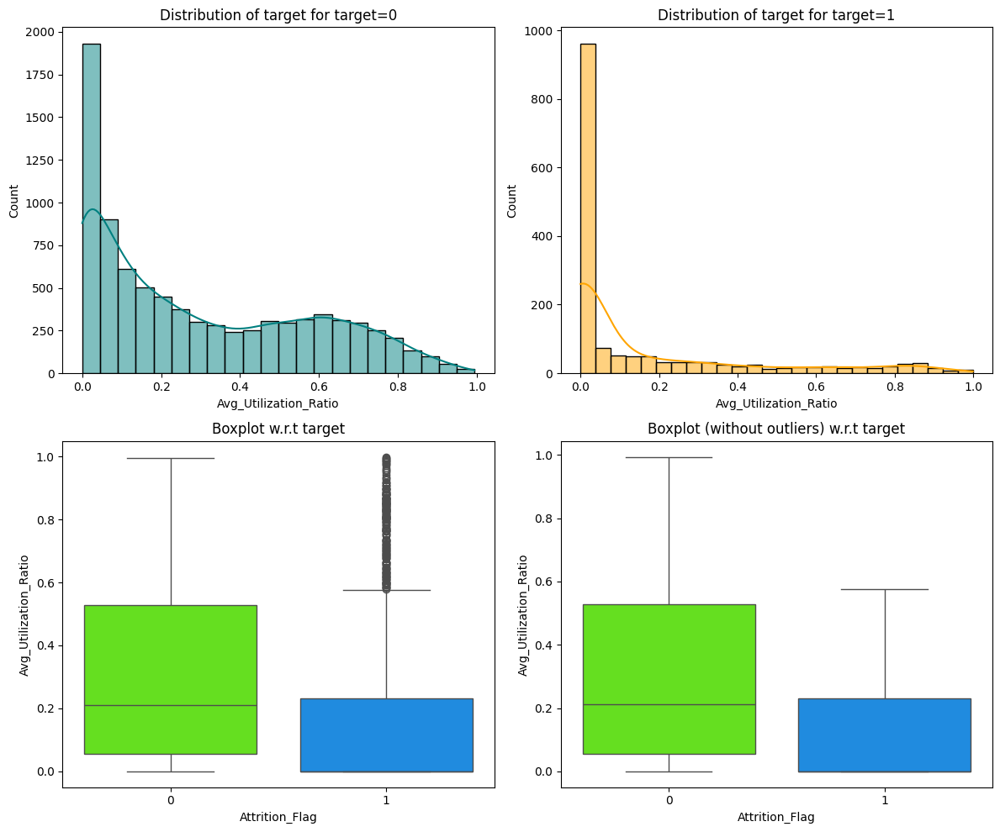

In [127]:
distribution_plot_wrt_target(data=CCchurn_df, predictor='Avg_Utilization_Ratio', target='Attrition_Flag')

#### EDA Summary:

-  There are 10127 rows in the dataset and 21 columns
-  There are 6 object type columns and the rest are numerical columns.
- Education_Level and Marital_Status columns have null values.

#####Univariate Analysis Summary

* Customer Age:
    * Customer Age is uniformly distributed.
    * There are few outliers.
    * Mean and Median age is pretty close and is around 46
* Dependent count:
    * Dependent count is uniformly distributed.
* Months on book:
    * Number of customers peak at around 36 months.
* Total relationship count:
    * More number of customers have Total relationship count as 3
* Months_inactive_12_mon
    * Months_Inactive_12_mon is right skewed.
    * There are outliers.
    * More number of customers have 3 months inactive in the last 12 months.
* Contacts_Count_12_mon
    * Contacts_Count_12_mon is right skewed.
* Credit_Limit
    * Credit limit is right skewed.
* Total_Revolving_Bal
    * Total Revolving Bal is left skewed.
* Avg_Open_To_Buy
    * Avg_Open_To_Buy is right skewed.
* Total_Amt_Chng_Q4_Q1
    * Its a right skewed distribution
* Total_Trans_Amt
    * Its a right skewed distribution.
* Total_Trans_Ct
    * its a left skewed distribution.
* Total_Ct_Chng_Q4_Q1
    * Its right skewed distribution.
* Avg_Utilization_Ratio
    * Its a right skewed distribution.
*   Attrition_Flag:
    * 83.9% are existing customers and 16.1% are attrited customers.
    * This is an imbalanced dataset.
* Education_Level
    * Highest number of customers have graduate degree followed by high school degree and uneducated customers.
    * Least number of customers have Doctorate.
* Marital_Status
    * There are more married customers.
    * There are least number of Divorced customers.
* Income_Category
    * Highest number of customers have income less than $40k followed by customers with income 40k-60k.
    * Least number of customers( 727 customers )with high income - $120k+ .
* Card_Category
    * Highest number of customers have Blue Card.
    * Least number of customers have Platinum card.



##### Bivariate Analysis Summary

**Highly Correlated attributes:**

  - Positive Correlation

       - Total_Trans_Ct and Total_Trans_Amt
       - Customer_Age and Months_on_book
       - Avg_Utilization_Ratio and Total_Revolving_Bal

  - Negative Correlation
       - Avg_Utlization_Ratio and Avg_Open_To_Buy
       - Avg_Utilzation_Ratio and Credit_Limit

**Key relationships with target variable**

Dependent count vs attrition flag
* In Boxplot, there are few outliers for attrited customers. The IQR range is wider in existing customers( 1 to 3) when compared to attrited customers(2 to 3).This indicates more variability in existing customers than the attrited customers.
* In histogram, most frequently occured values is 2 and 3 in existing customers and 3 for attrited customers.

Total relationship count vs attrition flag
* In histplot, we see that highest number of customers have total relationship count of 3.
* In boxplot, we see more variability or IQR wider range in attrited customers.
* The median of attrited customer is lower than existing customers. So existing customers tend to have more products when compared to the attrited customer.

Months_Inactive_12_mon vs Attrition_Flag
* In histplot, we see that max number of customers have months_inactive_12_mon as 3. This is for both existing and attrited customers.
* In boxplot, we see wider IQR range of 1 to 3 for existing customers and 2 to 3 range for attrited customer.
* Median is 2 for existing customers and 3 for attrited customers.

Total_Revolving_Bal vs Attrition_Flag
* In histplot, we see that most customers in both existing customers and attrited customers category have 0 Total revolving balance
* In Box plot, we see that attrited customers have wider IQR range from 0 to 1400 dollars. Existing customers IQR range from around 800 dollars to 1800 dollars.
* Median for existing customers is around 1400 dollars and 0 for attrited customers.

Total_Trans_Amt vs Attrition_Flag
* In histplot, we see the total_trans_amt is upto 10000 for attrited customers and 17500 for existing customers.
* In Boxplot, we see outliers for both types of customers. Variability is wider with existing customers than attrited customers.IQR range is from 2500 dollars to 5000 dollars for existing customers and 2000 dollars to around 2750 dollars for attrited customers.

Total_Trans_Ct vs Attrition_Flag
 -  In boxplot, we see the IQR range is from 55 to 80 for existing customers and 38 to 50 for attrited customers. We see that the total transaction count is relatively lower in attrited customers.

Total_Ct_Chng_Q4_Q1 vs Attrition_Flag
* The Total_Ct_Chng_Q4_Q1 IQR range(Q1 and Q4) is wider for attrited customers than existing customers. There is more variability in attrited customers.
* Attrited customers have lower median change in transaction amount between Q4 and Q1 when compared to existing customers.
* There are more outliers with existing customers and ranges till around 3.6 when compared to 2.5 for attrited customers.

## Data Pre-processing

**Outlier detection and treatment**

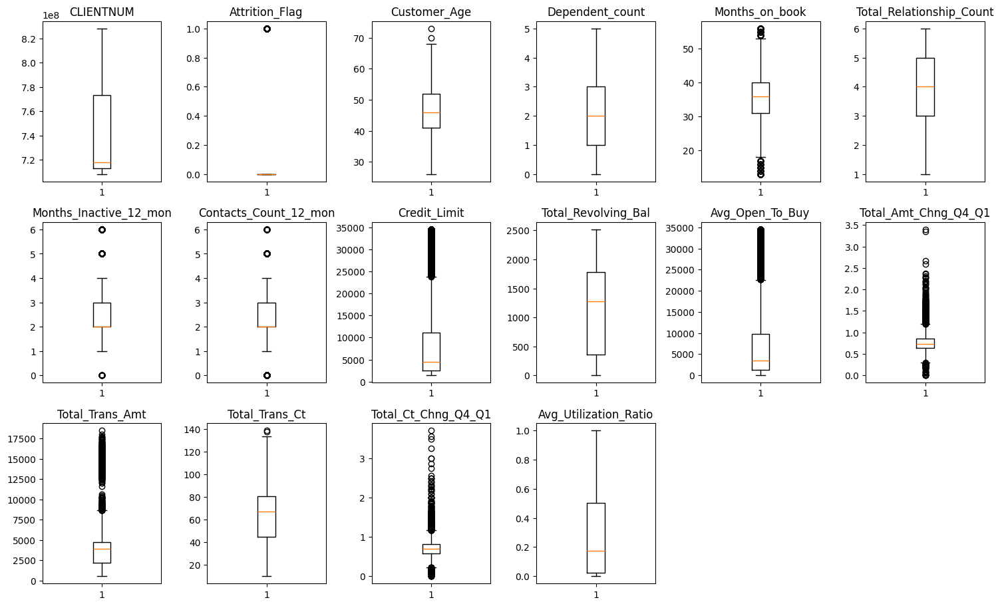

In [128]:
# outlier detection using boxplot
numeric_columns = CCchurn_df.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(15, 12))

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 6, i + 1)
    plt.boxplot(CCchurn_df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

Observations:
- Ignore CLIENTNUM, Attrition_Flag
- There are outliers in Customer_Age, Months_on_book,Months_Inactive_12_mon, Contacts_Count_12_mon,Credit_Limit, Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1.
- They are all valid values. So we will not treat them.


In [129]:
CCchurn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  int64  
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [130]:
#print values of object variables
print(CCchurn_df.Gender.value_counts())
print(CCchurn_df.Education_Level.value_counts())
print(CCchurn_df.Marital_Status.value_counts())
print(CCchurn_df.Income_Category.value_counts())
print(CCchurn_df.Card_Category.value_counts())

Gender
F    5358
M    4769
Name: count, dtype: int64
Education_Level
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64
Marital_Status
Married     4687
Single      3943
Divorced     748
Name: count, dtype: int64
Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: count, dtype: int64
Card_Category
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: count, dtype: int64


In [131]:
#construct replaceStruct and OneHotCols to convert objects to categories
replaceStruct = {
                "Education_Level":     {"Uneducated": 1, "High School":2 , "College": 3, "Graduate": 4, "Post-Graduate": 5, "Doctorate": 6},
                "Income_Category":     {"Less than $40K": 1, "$40K - $60K":2 , "$60K - $80K": 3, "$80K - $120K": 4, "$120K +": 5},
                "Card_Category":     {"Blue": 1, "Silver":2 , "Gold": 3, "Platinum": 4}
                }
# Gender and Marital_status doesnt have hierarchy or ranking,so do one hote encoding
oneHotCols=["Gender","Marital_Status"]

In [132]:
X = CCchurn_df.drop('Attrition_Flag', axis=1)
y = CCchurn_df['Attrition_Flag']

In [133]:
X_temp,X_test,y_temp,y_test = train_test_split(X,y,test_size=0.2,random_state=1,stratify=y)

X_train,X_val,y_train,y_val = train_test_split(X_temp,y_temp,test_size=0.25,random_state=1,stratify=y_temp)

**Pre-process X_train dataset**

In [134]:
X_train[X_train['Income_Category'] != 'abc']['Income_Category'].mode()

,Income_Category
0,Less than $40K


In [135]:
# Income category has value "abc", replace it with Mean value in X_train
# Calculate the most frequent value (mode) of 'Income_Category' in X_train, excluding "abc" values
mode_income_train = X_train[X_train['Income_Category'] != 'abc']['Income_Category'].mode()[0] # Get the first mode (most frequent)

# Replace "abc" with the mode in X_train
X_train['Income_Category'].replace('abc', mode_income_train, inplace=True)



In [136]:
#convert X_train object to category variables
X_train.replace(replaceStruct, inplace=True)
#do one hot encoding after missing value treatment since you will run into issues with Marital_Status variable otherwise


In [137]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6075 entries, 800 to 4035
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 6075 non-null   int64  
 1   Customer_Age              6075 non-null   int64  
 2   Gender                    6075 non-null   object 
 3   Dependent_count           6075 non-null   int64  
 4   Education_Level           5147 non-null   float64
 5   Marital_Status            5618 non-null   object 
 6   Income_Category           6075 non-null   int64  
 7   Card_Category             6075 non-null   int64  
 8   Months_on_book            6075 non-null   int64  
 9   Total_Relationship_Count  6075 non-null   int64  
 10  Months_Inactive_12_mon    6075 non-null   int64  
 11  Contacts_Count_12_mon     6075 non-null   int64  
 12  Credit_Limit              6075 non-null   float64
 13  Total_Revolving_Bal       6075 non-null   int64  
 14  Avg_Open_To

**Pre-process X_val dataset**

In [138]:
X_val[X_val['Income_Category'] != 'abc']['Income_Category'].mode()

,Income_Category
0,Less than $40K


In [139]:
# Income category has value "abc", replace it with Mean value in X_val
# Calculate the most frequent value (mode) of 'Income_Category' in X_val, excluding "abc" values
mode_income_val = X_val[X_val['Income_Category'] != 'abc']['Income_Category'].mode()[0] # Get the first mode (most frequent)

# Replace "abc" with the mode in X_train
X_val['Income_Category'].replace('abc', mode_income_val, inplace=True)


In [140]:
#convert X_train object to category variables
X_val.replace(replaceStruct, inplace=True)
#do one hot encoding after missing value treatment since you will run into issues with Marital_Status variable otherwise


In [141]:
X_val.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2026 entries, 2894 to 6319
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 2026 non-null   int64  
 1   Customer_Age              2026 non-null   int64  
 2   Gender                    2026 non-null   object 
 3   Dependent_count           2026 non-null   int64  
 4   Education_Level           1732 non-null   float64
 5   Marital_Status            1886 non-null   object 
 6   Income_Category           2026 non-null   int64  
 7   Card_Category             2026 non-null   int64  
 8   Months_on_book            2026 non-null   int64  
 9   Total_Relationship_Count  2026 non-null   int64  
 10  Months_Inactive_12_mon    2026 non-null   int64  
 11  Contacts_Count_12_mon     2026 non-null   int64  
 12  Credit_Limit              2026 non-null   float64
 13  Total_Revolving_Bal       2026 non-null   int64  
 14  Avg_Open_T

**Pre-process X_test dataset**

In [142]:
X_test[X_test['Income_Category'] != 'abc']['Income_Category'].mode()

,Income_Category
0,Less than $40K


In [143]:
# Income category has value "abc", replace it with Mean value in X_test
# Calculate the most frequent value (mode) of 'Income_Category' in X_test, excluding "abc" values
mode_income_test = X_test[X_test['Income_Category'] != 'abc']['Income_Category'].mode()[0] # Get the first mode (most frequent)

# Replace "abc" with the mode in X_train
X_test['Income_Category'].replace('abc', mode_income_test, inplace=True)

In [144]:
#convert X_train object to category variables
X_test.replace(replaceStruct, inplace=True)
#do one hot encoding after missing value treatment since you will run into issues with Marital_Status variable otherwise


In [145]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2026 entries, 9760 to 413
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 2026 non-null   int64  
 1   Customer_Age              2026 non-null   int64  
 2   Gender                    2026 non-null   object 
 3   Dependent_count           2026 non-null   int64  
 4   Education_Level           1729 non-null   float64
 5   Marital_Status            1874 non-null   object 
 6   Income_Category           2026 non-null   int64  
 7   Card_Category             2026 non-null   int64  
 8   Months_on_book            2026 non-null   int64  
 9   Total_Relationship_Count  2026 non-null   int64  
 10  Months_Inactive_12_mon    2026 non-null   int64  
 11  Contacts_Count_12_mon     2026 non-null   int64  
 12  Credit_Limit              2026 non-null   float64
 13  Total_Revolving_Bal       2026 non-null   int64  
 14  Avg_Open_To

## Missing value imputation




In [146]:
CCchurn_df.isnull().sum()

,0
CLIENTNUM,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0


In [147]:
#Use Simple Imputer to fill missing values in Education level in X_train, X_val

imputer = SimpleImputer(strategy='most_frequent')
X_train['Education_Level'] = imputer.fit_transform(X_train[['Education_Level']]).ravel()
X_val['Education_Level'] = imputer.fit_transform(X_val[['Education_Level']]).ravel()

In [148]:
X_test['Education_Level'] = imputer.fit_transform(X_test[['Education_Level']]).ravel()

In [149]:
#Use Simple Imputer to fill missing values in Marital Status in X_train, X_val

marital_imputer = SimpleImputer(strategy='most_frequent')
X_train['Marital_Status'] = marital_imputer.fit_transform(X_train[['Marital_Status']]).ravel()
X_val['Marital_Status'] = marital_imputer.transform(X_val[['Marital_Status']]).ravel()

In [150]:
X_test['Marital_Status'] = marital_imputer.transform(X_test[['Marital_Status']]).ravel()

In [151]:
X_train.isnull().sum()

,0
CLIENTNUM,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


In [152]:
X_val.isnull().sum()

,0
CLIENTNUM,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


In [153]:
X_test.isnull().sum()

,0
CLIENTNUM,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


In [154]:
#perform one hot encoding
X_train = pd.get_dummies(X_train, columns=oneHotCols,drop_first=True)
X_val = pd.get_dummies(X_val, columns=oneHotCols,drop_first=True)
X_test = pd.get_dummies(X_test, columns=oneHotCols,drop_first=True)

In [155]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6075 entries, 800 to 4035
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 6075 non-null   int64  
 1   Customer_Age              6075 non-null   int64  
 2   Dependent_count           6075 non-null   int64  
 3   Education_Level           6075 non-null   float64
 4   Income_Category           6075 non-null   int64  
 5   Card_Category             6075 non-null   int64  
 6   Months_on_book            6075 non-null   int64  
 7   Total_Relationship_Count  6075 non-null   int64  
 8   Months_Inactive_12_mon    6075 non-null   int64  
 9   Contacts_Count_12_mon     6075 non-null   int64  
 10  Credit_Limit              6075 non-null   float64
 11  Total_Revolving_Bal       6075 non-null   int64  
 12  Avg_Open_To_Buy           6075 non-null   float64
 13  Total_Amt_Chng_Q4_Q1      6075 non-null   float64
 14  Total_Trans

In [156]:
X_val.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2026 entries, 2894 to 6319
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 2026 non-null   int64  
 1   Customer_Age              2026 non-null   int64  
 2   Dependent_count           2026 non-null   int64  
 3   Education_Level           2026 non-null   float64
 4   Income_Category           2026 non-null   int64  
 5   Card_Category             2026 non-null   int64  
 6   Months_on_book            2026 non-null   int64  
 7   Total_Relationship_Count  2026 non-null   int64  
 8   Months_Inactive_12_mon    2026 non-null   int64  
 9   Contacts_Count_12_mon     2026 non-null   int64  
 10  Credit_Limit              2026 non-null   float64
 11  Total_Revolving_Bal       2026 non-null   int64  
 12  Avg_Open_To_Buy           2026 non-null   float64
 13  Total_Amt_Chng_Q4_Q1      2026 non-null   float64
 14  Total_Tran

In [157]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2026 entries, 9760 to 413
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 2026 non-null   int64  
 1   Customer_Age              2026 non-null   int64  
 2   Dependent_count           2026 non-null   int64  
 3   Education_Level           2026 non-null   float64
 4   Income_Category           2026 non-null   int64  
 5   Card_Category             2026 non-null   int64  
 6   Months_on_book            2026 non-null   int64  
 7   Total_Relationship_Count  2026 non-null   int64  
 8   Months_Inactive_12_mon    2026 non-null   int64  
 9   Contacts_Count_12_mon     2026 non-null   int64  
 10  Credit_Limit              2026 non-null   float64
 11  Total_Revolving_Bal       2026 non-null   int64  
 12  Avg_Open_To_Buy           2026 non-null   float64
 13  Total_Amt_Chng_Q4_Q1      2026 non-null   float64
 14  Total_Trans

## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.

**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [158]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

**Lets define a function for confusion matrix**

In [159]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

### Model Building with original data

Sample code for model building with original data

In [160]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.9836065573770492
Random forest: 1.0
GBM: 0.8760245901639344
Adaboost: 0.8411885245901639
Xgboost: 1.0
dtree: 1.0

Validation Performance:

Bagging: 0.8251533742331288
Random forest: 0.8098159509202454
GBM: 0.8588957055214724
Adaboost: 0.8343558282208589
Xgboost: 0.8895705521472392
dtree: 0.8374233128834356


In [161]:
print("\nTraining and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_train = recall_score(y_train, model.predict(X_train))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference2 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference2))


Training and Validation Performance Difference:

Bagging: Training Score: 0.9836, Validation Score: 0.8252, Difference: 0.1585
Random forest: Training Score: 1.0000, Validation Score: 0.8098, Difference: 0.1902
GBM: Training Score: 0.8760, Validation Score: 0.8589, Difference: 0.0171
Adaboost: Training Score: 0.8412, Validation Score: 0.8344, Difference: 0.0068
Xgboost: Training Score: 1.0000, Validation Score: 0.8896, Difference: 0.1104
dtree: Training Score: 1.0000, Validation Score: 0.8374, Difference: 0.1626


**Observations:**
- With default parameters, Xgboost is the best model followed by GBM and decision tree.

### Model Building with Oversampled data


In [162]:
print("Before Oversampling, counts of Attrited Customers: {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of Existing Customers: {} \n".format(sum(y_train == 0)))

Before Oversampling, counts of Attrited Customers: 976
Before Oversampling, counts of Existing Customers: 5099 



In [163]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [164]:
print("After Oversampling, counts of Attrited Customers: {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of Existing Customers: {} \n".format(sum(y_train_over == 0)))


print("After Oversampling, the shape of X_train_over: {}".format(X_train_over.shape))
print("After Oversampling, the shape of y_train_over: {} \n".format(y_train_over.shape))

After Oversampling, counts of Attrited Customers: 5099
After Oversampling, counts of Existing Customers: 5099 

After Oversampling, the shape of X_train_over: (10198, 21)
After Oversampling, the shape of y_train_over: (10198,) 



In [165]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.9972543636007061
Random forest: 1.0
GBM: 0.9686212982937831
Adaboost: 0.9564620513826241
Xgboost: 1.0
dtree: 1.0

Validation Performance:

Bagging: 0.8803680981595092
Random forest: 0.8865030674846626
GBM: 0.8926380368098159
Adaboost: 0.9202453987730062
Xgboost: 0.8957055214723927
dtree: 0.8159509202453987


In [166]:
print("\nTraining and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores_train = recall_score(y_train_over, model.predict(X_train_over))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference2 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference2))


Training and Validation Performance Difference:

Bagging: Training Score: 0.9973, Validation Score: 0.8804, Difference: 0.1169
Random forest: Training Score: 1.0000, Validation Score: 0.8865, Difference: 0.1135
GBM: Training Score: 0.9686, Validation Score: 0.8926, Difference: 0.0760
Adaboost: Training Score: 0.9565, Validation Score: 0.9202, Difference: 0.0362
Xgboost: Training Score: 1.0000, Validation Score: 0.8957, Difference: 0.1043
dtree: Training Score: 1.0000, Validation Score: 0.8160, Difference: 0.1840


**Observations:**
- With oversampling data, Adbaboost is the best model followed by Xgboost and GBM.

### Model Building with Undersampled data

In [167]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [168]:
print("Before Under Sampling, counts of Attrited Customers: {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of Existing Customers: {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of Attrited Customers: {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of Existing Customers: {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of X_train_un: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of y_train_un: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of Attrited Customers: 976
Before Under Sampling, counts of Existing Customers: 5099 

After Under Sampling, counts of Attrited Customers: 976
After Under Sampling, counts of Existing Customers: 976 

After Under Sampling, the shape of X_train_un: (1952, 21)
After Under Sampling, the shape of y_train_un: (1952,) 



In [169]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.9918032786885246
Random forest: 1.0
GBM: 0.9795081967213115
Adaboost: 0.9497950819672131
Xgboost: 1.0
dtree: 1.0

Validation Performance:

Bagging: 0.9325153374233128
Random forest: 0.941717791411043
GBM: 0.9601226993865031
Adaboost: 0.9601226993865031
Xgboost: 0.9693251533742331
dtree: 0.8987730061349694


In [170]:
print("\nTraining and Validation Performance Difference:\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores_train = recall_score(y_train_un, model.predict(X_train_un))
    scores_val = recall_score(y_val, model.predict(X_val))
    difference2 = scores_train - scores_val
    print("{}: Training Score: {:.4f}, Validation Score: {:.4f}, Difference: {:.4f}".format(name, scores_train, scores_val, difference2))


Training and Validation Performance Difference:

Bagging: Training Score: 0.9918, Validation Score: 0.9325, Difference: 0.0593
Random forest: Training Score: 1.0000, Validation Score: 0.9417, Difference: 0.0583
GBM: Training Score: 0.9795, Validation Score: 0.9601, Difference: 0.0194
Adaboost: Training Score: 0.9498, Validation Score: 0.9601, Difference: -0.0103
Xgboost: Training Score: 1.0000, Validation Score: 0.9693, Difference: 0.0307
dtree: Training Score: 1.0000, Validation Score: 0.8988, Difference: 0.1012


**Observations:**
- With undersampling data, Xgboost is the best model followed by Adaboost and GBM.

**Summary of default, over sampling and under sampling Model performance**
- Top 5 models out of 15 models(default, over sampling and under sampling models) are all under sampling models

Top 5 Models :

1. Under sampling Xgboost: Training Score: 1.0000, Validation Score: 0.9693, Difference: 0.0307
2. Under sampling Adaboost: Training Score: 0.9498, Validation Score: 0.9601, Difference: -0.0103
3. Under sampling GBM: Training Score: 0.9795, Validation Score: 0.9601, Difference: 0.0194
4. Under sampling Random forest: Training Score: 1.0000, Validation Score: 0.9417, Difference: 0.0583
5. Under sampling Bagging: Training Score: 0.9918, Validation Score: 0.9325, Difference: 0.0593

- We will select the top 5 models to do hyperparameter tuning.

### HyperparameterTuning

#### Sample Parameter Grids

**Note**

1. Sample parameter grids have been provided to do necessary hyperparameter tuning. These sample grids are expected to provide a balance between model performance improvement and execution time. One can extend/reduce the parameter grid based on execution time and system configuration.
  - Please note that if the parameter grid is extended to improve the model performance further, the execution time will increase


- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

####XGBoost with undersampled data

In [172]:
# defining model
Model = XGBClassifier(random_state=1, eval_metric="logloss")

# Parameter grid to pass in RandomSearchCV
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}

scorer = metrics.make_scorer(recall_score)
#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

#get the best model
best_model = randomized_cv.best_estimator_

#get the best parameters
best_params = randomized_cv.best_params_

#get the best score
best_score = randomized_cv.best_score_

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'scale_pos_weight': 5, 'n_estimators': 75, 'learning_rate': 0.05, 'gamma': 3} with CV score=0.9785190999476715:


In [173]:
xgb_tuned = XGBClassifier(random_state=1, eval_metric="logloss",**best_params)
xgb_tuned.fit(X_train_un, y_train_un)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=3, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=75, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=1, ...)

In [174]:
# Calculating different metrics on train set
xgboost_random_train = model_performance_classification_sklearn(
    xgb_tuned, X_train_un, y_train_un
)
print("Training performance:")
xgboost_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.957,1.000,0.922,0.959


In [175]:
# Calculating different metrics on validation set
xgboost_random_val = model_performance_classification_sklearn(xgb_tuned, X_val, y_val)
print("Validation performance:")
xgboost_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.894,0.991,0.605,0.751


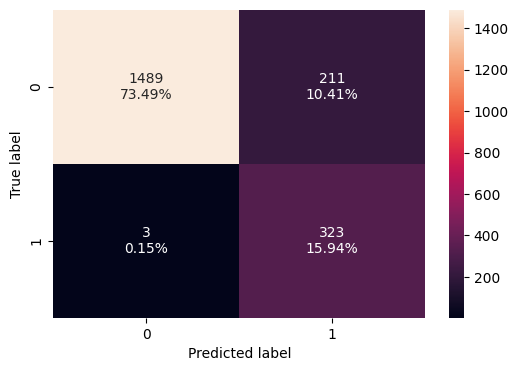

In [176]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned, X_val, y_val)

####Adaboost with undersampled data

In [177]:
# defining model
Model = AdaBoostClassifier(random_state=1)

param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

scorer = metrics.make_scorer(recall_score)
#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

#get the best model
best_model = randomized_cv.best_estimator_

#get the best parameters
best_params = randomized_cv.best_params_

#get the best score
best_score = randomized_cv.best_score_

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 100, 'learning_rate': 0.1, 'estimator': DecisionTreeClassifier(max_depth=3, random_state=1)} with CV score=0.943657770800628:


In [178]:
abc_tuned = AdaBoostClassifier(random_state=1,**best_params)
abc_tuned.fit(X_train_un, y_train_un)

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=3,
                                                    random_state=1),
                   learning_rate=0.1, n_estimators=100, random_state=1)

In [179]:
# Calculating different metrics on train set
abc_random_train = model_performance_classification_sklearn(
    abc_tuned, X_train_un, y_train_un
)
print("Training performance:")
abc_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.991,0.996,0.986,0.991


In [180]:
# Calculating different metrics on val set
abc_random_val = model_performance_classification_sklearn(abc_tuned, X_val, y_val)
print("Validation performance:")
abc_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.942,0.957,0.750,0.841


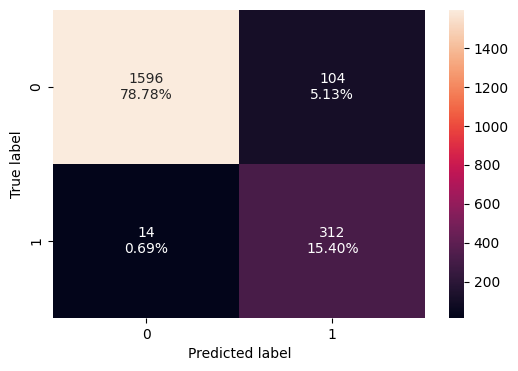

In [181]:
# Creating the confusion matrix
confusion_matrix_sklearn(abc_tuned, X_val, y_val)

####GBM with undersampled data

In [182]:
# defining model
Model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}

scorer = metrics.make_scorer(recall_score)
#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

#get the best model
best_model = randomized_cv.best_estimator_

#get the best parameters
best_params = randomized_cv.best_params_

#get the best score
best_score = randomized_cv.best_score_

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'n_estimators': 100, 'max_features': 0.7, 'learning_rate': 0.05, 'init': DecisionTreeClassifier(random_state=1)} with CV score=0.8780900052328624:


In [183]:
gbm_tuned = GradientBoostingClassifier(
    random_state=1,
    subsample=0.7,
    n_estimators=100,
    max_features=0.7,
    learning_rate=0.05,
    init=DecisionTreeClassifier(random_state=1),
)
gbm_tuned.fit(X_train_un, y_train_un)

GradientBoostingClassifier(init=DecisionTreeClassifier(random_state=1),
                           learning_rate=0.05, max_features=0.7, random_state=1,
                           subsample=0.7)

In [184]:
# Calculating different metrics on train set
gbm_random_train = model_performance_classification_sklearn(
    gbm_tuned, X_train_un, y_train_un
)
print("Training performance:")
gbm_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [185]:
# Calculating different metrics on val set
gbm_random_val = model_performance_classification_sklearn(gbm_tuned, X_val, y_val)
print("Validation performance:")
gbm_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.894,0.899,0.617,0.732


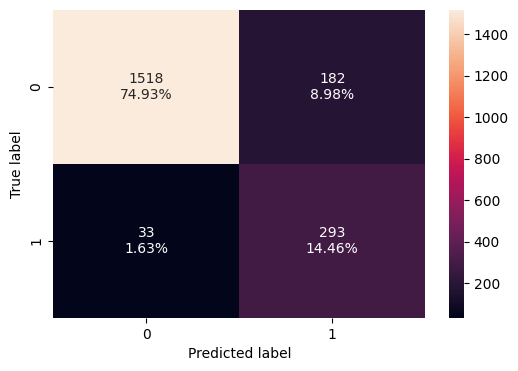

In [186]:
# Creating the confusion matrix
confusion_matrix_sklearn(gbm_tuned, X_val, y_val)

#### Random Forest with undersampled data

In [187]:
# defining model
Model = RandomForestClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}

scorer = metrics.make_scorer(recall_score)
#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

#get the best model
best_model = randomized_cv.best_estimator_

#get the best parameters
best_params = randomized_cv.best_params_

#get the best score
best_score = randomized_cv.best_score_

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 110, 'min_samples_leaf': 1, 'max_samples': 0.6, 'max_features': 'sqrt'} with CV score=0.932370486656201:


In [188]:
#rf_tuned = RandomForestClassifier(random_state=1, **best_params)
rf_tuned = RandomForestClassifier(random_state=1, n_estimators=110, min_samples_leaf=1, max_features='sqrt', max_samples=0.6)
rf_tuned.fit(X_train_un, y_train_un)

RandomForestClassifier(max_samples=0.6, n_estimators=110, random_state=1)

In [189]:
# Calculating different metrics on val set
rf_random_train = model_performance_classification_sklearn(rf_tuned, X_train_un, y_train_un)
print("Training performance:")
rf_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.998,0.999,0.997,0.998


In [190]:
# Calculating different metrics on val set
rf_random_val = model_performance_classification_sklearn(rf_tuned, X_val, y_val)
print("Validation performance:")
rf_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.933,0.942,0.724,0.819


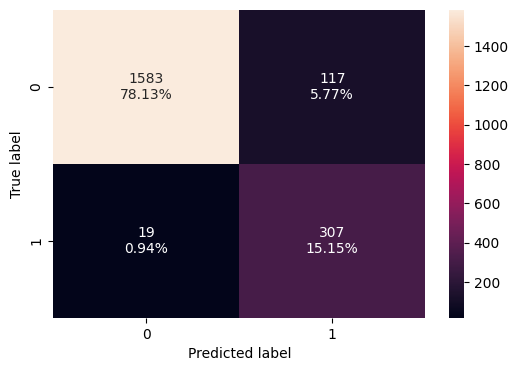

In [191]:
# Creating the confusion matrix
confusion_matrix_sklearn(rf_tuned, X_val, y_val)

#### Bagging with undersampled data

In [192]:
# defining model
Model = BaggingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}

scorer = metrics.make_scorer(recall_score)
#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

#get the best model
best_model = randomized_cv.best_estimator_

#get the best parameters
best_params = randomized_cv.best_params_

#get the best score
best_score = randomized_cv.best_score_

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 70, 'max_samples': 1, 'max_features': 0.8} with CV score=1.0:


In [193]:
bg_tuned = BaggingClassifier(random_state=1, n_estimators=70, max_samples = 1, max_features = 0.8)
bg_tuned.fit(X_train_un, y_train_un)

BaggingClassifier(max_features=0.8, max_samples=1, n_estimators=70,
                  random_state=1)

In [194]:
# Calculating different metrics on val set
bg_random_train = model_performance_classification_sklearn(bg_tuned, X_train_un, y_train_un)
print("Training performance:")
bg_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.500,0.000,0.000,0.000


In [195]:
# Calculating different metrics on val set
bg_random_val = model_performance_classification_sklearn(bg_tuned, X_val, y_val)
print("Validation performance:")
bg_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.839,0.000,0.000,0.000


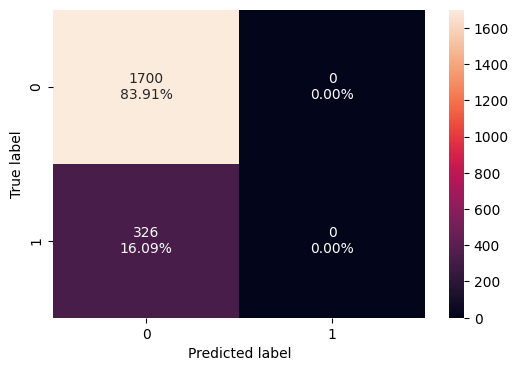

In [196]:
# Creating the confusion matrix
confusion_matrix_sklearn(bg_tuned, X_val, y_val)

## Model Comparison and Final Model Selection

In [197]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        xgboost_random_train.T,
        abc_random_train.T,
        gbm_random_train.T,
        rf_random_train.T,
        bg_random_train.T
    ],
    axis=1,
)
models_train_comp_df.columns = [
        "XGBoost trained with Undersampled data",
        "Adaboost trained with Undersampled data",
        "GBM trained with Undersampled data",
        "Random Forest trained with Undersampled data",
        "Bagging trained with Undersampled data",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,XGBoost trained with Undersampled data,Adaboost trained with Undersampled data,GBM trained with Undersampled data,Random Forest trained with Undersampled data,Bagging trained with Undersampled data
Accuracy,0.957,0.991,1.000,0.998,0.500
Recall,1.000,0.996,1.000,0.999,0.000
Precision,0.922,0.986,1.000,0.997,0.000
F1,0.959,0.991,1.000,0.998,0.000


In [198]:
# Validation performance comparison

models_train_comp_df = pd.concat(
    [
        xgboost_random_val.T,
        abc_random_val.T,
        gbm_random_val.T,
        rf_random_val.T,
        bg_random_val.T
    ],
    axis=1,
)
models_train_comp_df.columns = [
        "XGBoost trained with Undersampled data",
        "Adaboost trained with Undersampled data",
        "GBM trained with Undersampled data",
        "Random Forest trained with Undersampled data",
        "Bagging trained with Undersampled data",
]
print("Validation performance comparison:")
models_train_comp_df

Validation performance comparison:


,XGBoost trained with Undersampled data,Adaboost trained with Undersampled data,GBM trained with Undersampled data,Random Forest trained with Undersampled data,Bagging trained with Undersampled data
Accuracy,0.894,0.942,0.894,0.933,0.839
Recall,0.991,0.957,0.899,0.942,0.000
Precision,0.605,0.750,0.617,0.724,0.000
F1,0.751,0.841,0.732,0.819,0.000


**Observations :**
- XGBoost with undersampled data and with hyper parameters generalize well and is the best model when compared to the other models.

#### Feature Importance for final Model (XGBoost - undersampled data and hypertuned parameters)

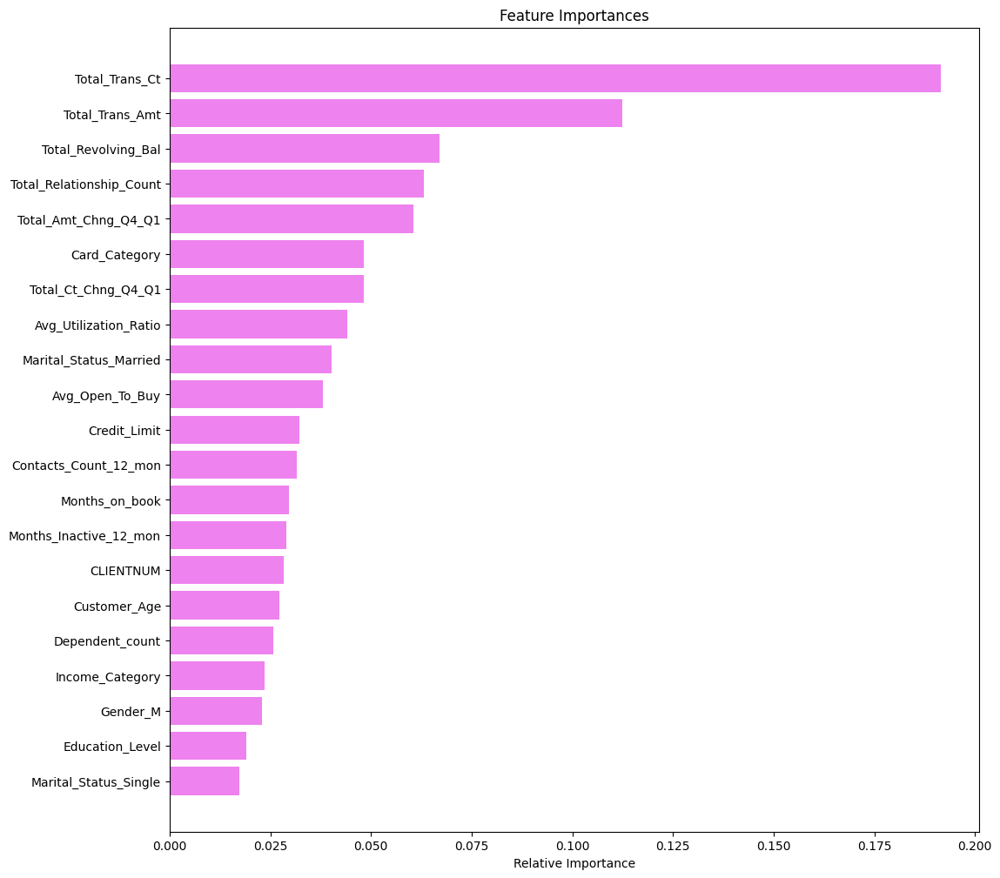

In [199]:
feature_names = X_train_un.columns
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

**Observations:**
- The top 3 important features are Total_Trans_Ct, Total_Trans_Amt and Total_Revolving_Bal.

### Test set final performance

In [200]:
# Calculating different metrics on test data
xgboost_random_test = model_performance_classification_sklearn(xgb_tuned, X_test, y_test)
print("Testing performance:")
xgboost_random_test

Testing performance:


,Accuracy,Recall,Precision,F1
0,0.873,0.982,0.560,0.713


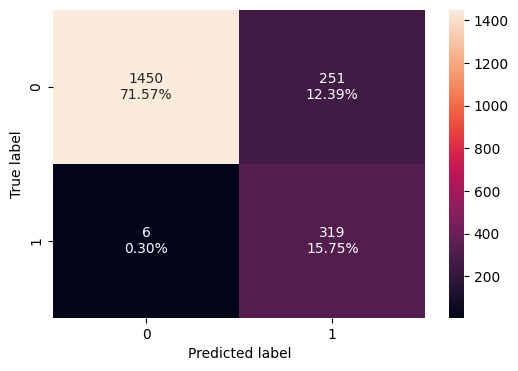

In [201]:
#confustion matrix on test for final model
confusion_matrix_sklearn(xgb_tuned, X_test, y_test)

Observations:
- The final model -XGBoost with undersampled data and hypertuned has performed very well with test data. Recall score of 0.982.
- The model has generalized well.

# Business Insights and Conclusions

- The final model will help the bank minimize false negatives. It has genarlized well with test data and has the highest recall score of 98.2%.
- Based on our analysis, we saw the most important features are Total transaction count, Total transaction amount, Total Revolving Balance and Total relationship count.
- We saw in our analysis that attrited customers had relatively lower count when compared to the existing customers. Bank should come up with ideas to engage the customers so that they use the bank as primary account.
- We saw in our analysis that attrited customers had lower total transaction amount when compared to existing customers. Bank should come up with ideas to engage the customers so that they use the bank as primary account.
- Total Revolving Balance is an important factor. Bank should come up with different schemes to attract customer to use the bank's credit card.
- Bank should regularly reach out to customers marketing the available products that the bank can offer. The bank should come up with offers so that we can get the customers to sign up for more products therby increasing the total relationship count which helps retain the customer.

***